In [2]:
import geopandas as gpd
import pandas as pd
import ee
import numpy as np
from scipy.stats import linregress, gaussian_kde
from src.data import mtbs
from src.data import raster
from src.data import pd_utils
from src.data import gedi_pipeline
from src.visualization.gedi_viz import geo_plot
import rasterio as rio
import matplotlib.pyplot as plt
from shapely.geometry import Point
from rasterio.plot import show
pd.options.mode.chained_assignment = None  # default='warn'
import seaborn as sns
from src.data import k_nn

sns.set_theme()

import importlib
importlib.reload(raster)
importlib.reload(gedi_pipeline)
importlib.reload(k_nn)

2023-05-20 17:08:09,262 DEBUG: Logger /home/jk871/fire-regen/src/data/gedi_pipeline.py already set up. [in get_logger at /home/jk871/fire-regen/src/utils/logging_util.py:51]


<module 'src.data.k_nn' from '/home/jk871/fire-regen/src/data/k_nn.py'>

In [3]:
gedi_gpd = gedi_pipeline.get_gedi_as_gdp('/maps/fire-regen/data/sierras_matched_lc_all_2x2.csv')
print(f'Total number of GEDI shots available for the region: {gedi_gpd.shape[0]}')

Total number of GEDI shots available for the region: 9884257


In [4]:
gedi_gpd = gedi_pipeline.process_shots(gedi_gpd)

### Filter GEDI data

In [5]:
gedi_burned, gedi_unburned = gedi_pipeline.filter_shots(gedi_gpd)

2023-05-20 17:10:04,196 DEBUG: Excluded shots on the burn boundaries, shots remaining:         9446235 [in filter_shots at /home/jk871/fire-regen/src/data/gedi_pipeline.py:36]
2023-05-20 17:10:04,579 DEBUG: Number of GEDI shots that burned at least once:                  1440937 [in filter_shots at /home/jk871/fire-regen/src/data/gedi_pipeline.py:41]
2023-05-20 17:10:05,919 DEBUG: Number of GEDI shots that never burned since 1984:         7852535 [in filter_shots at /home/jk871/fire-regen/src/data/gedi_pipeline.py:47]


In [6]:
gedi_burned = gedi_pipeline.filter_shots_for_regrowth_analysis(gedi_burned)

2023-05-20 17:10:18,613 DEBUG: Number of shots that happened after fires:                    1248004 [in filter_shots_for_regrowth_analysis at /home/jk871/fire-regen/src/data/gedi_pipeline.py:64]
2023-05-20 17:10:18,887 DEBUG: Number of shots that burned exactly once:                    1085566 [in filter_shots_for_regrowth_analysis at /home/jk871/fire-regen/src/data/gedi_pipeline.py:69]
2023-05-20 17:10:19,393 DEBUG: Number of shots that burned in 2-4 categories:                    917889 [in filter_shots_for_regrowth_analysis at /home/jk871/fire-regen/src/data/gedi_pipeline.py:74]
2023-05-20 17:10:19,525 DEBUG: Number of GEDI shots that have a perfect match with burn                    raster (all 3x3 pixels have the same severity):                    651178 [in filter_shots_for_regrowth_analysis at /home/jk871/fire-regen/src/data/gedi_pipeline.py:78]


In [7]:
gedi_burned_trees = gedi_pipeline.filter_for_trees(gedi_burned)
gedi_unburned_trees = gedi_pipeline.filter_for_trees(gedi_unburned)
print(f'GEDI shots that burned trees: {gedi_burned_trees.shape[0]}')
print(f'GEDI tree shots that didn\'t burn: {gedi_unburned_trees.shape[0]}')

GEDI shots that burned trees: 260640
GEDI tree shots that didn't burn: 3152125


In [8]:
gedi_trees = pd.concat([gedi_burned_trees, gedi_unburned_trees])
print(f'Total GEDI shots on trees: {gedi_trees.shape[0]}')

Total GEDI shots on trees: 3412765


In [9]:
gedi_trees.columns

Index(['shot_number', 'absolute_time', 'lon_lowestmode', 'lat_lowestmode',
       'agbd', 'agbd_pi_lower', 'agbd_pi_upper', 'agbd_se', 'l2_quality_flag',
       'l4_quality_flag', 'degrade_flag', 'beam_type', 'sensitivity',
       'pft_class', 'geometry', 'burn_severity_3x3', 'burn_severity_mean',
       'burn_severity_std', 'burn_severity_median', 'burn_year_3x3',
       'burn_year_mean', 'burn_year_std', 'burn_year_median',
       'burn_counts_3x3', 'burn_counts_mean', 'burn_counts_std',
       'burn_counts_median', 'land_cover_2x2', 'land_cover_mean',
       'land_cover_std', 'land_cover_median', 'gedi_year', 'gedi_month',
       'time_since_burn'],
      dtype='object')

In [9]:
gedi_trees = gedi_trees.drop(columns=['l2_quality_flag', 'l4_quality_flag', 'burn_severity_3x3',
    'burn_severity_mean', 'burn_severity_std', 'burn_year_3x3', 'burn_year_mean', 
    'burn_year_std', 'burn_counts_3x3', 'burn_counts_mean', 'burn_counts_std', 'land_cover_2x2', 'land_cover_mean', 'land_cover_std', 
    'land_cover_median', 'degrade_flag'])

In [ ]:
gedi_trees.to_csv('/maps/fire-regen/data/gedi_sierras_burn_lc_matched_trees_trimmed.csv')

In [8]:
gedi_trees.to_csv('/maps/fire-regen/data/gedi_sierras_burn_lc_matched_trees.csv')

### Visualize distribution of AGBD

<AxesSubplot: >

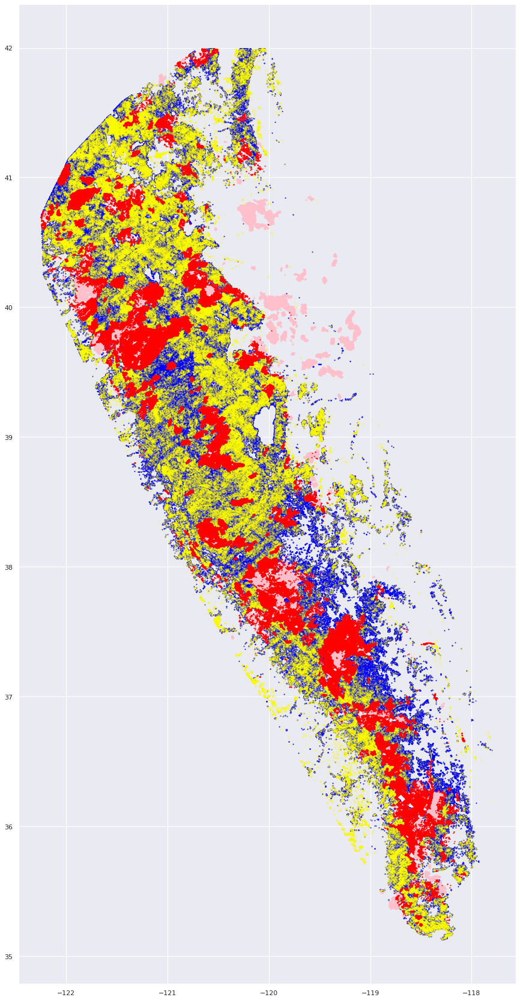

In [230]:
fig, ax = plt.subplots(1, 1, figsize=(36, 30))
gedi_gpd[gedi_gpd.burn_counts_median > 1].plot(ax=ax, color='pink', markersize=1)
gedi_unburned_trees[gedi_unburned_trees.agbd > 40].plot(ax=ax, color='blue', markersize=1)
gedi_unburned_trees[gedi_unburned_trees.agbd < 40].plot(ax=ax, color='yellow', markersize=1, alpha=0.2)
gedi_burned_trees.plot(ax=ax, color='red', markersize=1)

### Presence of plant classes in each GEDI category

Land cover is being currently derived from Dynamic World estimate from 2019. Legend:
* 0 - water
* 1 - trees
* 2 - grass
* 3 - flooded_vegetation
* 4 - crops
* 5 - shrub_and_scrub
* 6 - built
* 7 - bare
* 8 - snow and ice

TODO: Actually obtain land cover from the time before fire for burned pixels.

<AxesSubplot: xlabel='land_cover_median', ylabel='Count'>

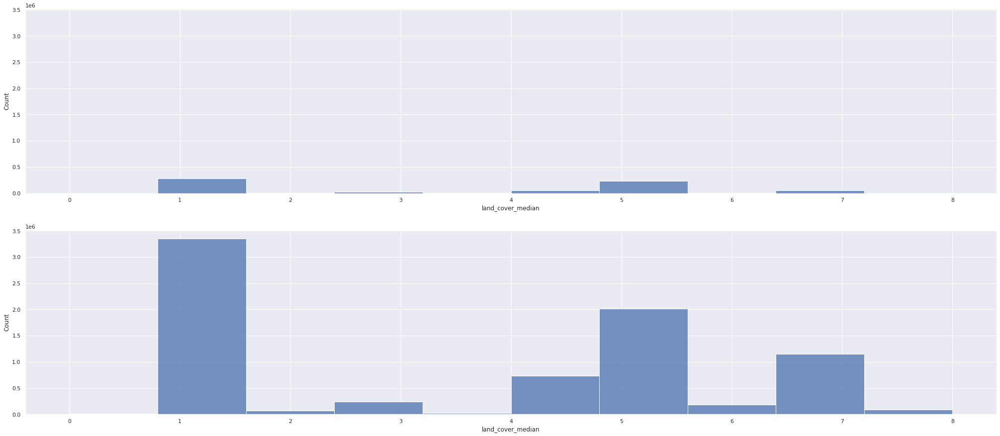

In [82]:
fig, ax = plt.subplots(2, 1, figsize=(35, 15), sharey=True)
sns.histplot(gedi_burned, x='land_cover_median', ax=ax[0], bins=10)
sns.histplot(gedi_unburned, x='land_cover_median', ax=ax[1], bins=10)

### Analyze only trees - land cover == 1

In [38]:
# Get rid of the first two years as the number of samples is skewing the data.
gedi_trees = gedi_trees[(gedi_trees.time_since_burn != 1) & ((gedi_trees.time_since_burn != 2))]

In [10]:
gedi_trees = gedi_pipeline.add_time_since_burn_categories(gedi_trees)

In [49]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    filtered = df.query(f'(@Q1 - 1.5 * @IQR) <= {column} <= (@Q3 + 1.5 * @IQR)')
    return filtered

In [50]:
gedi_trees_no = remove_outliers(gedi_trees, 'agbd')

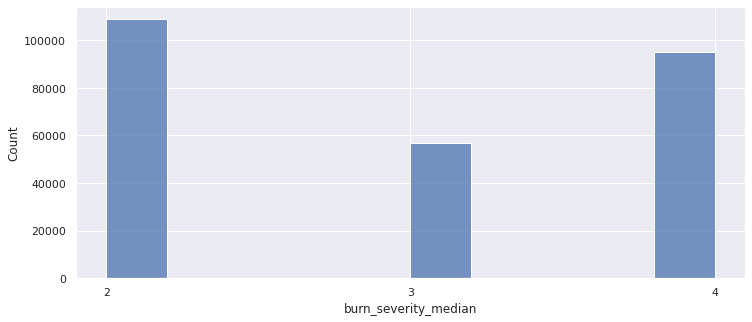

In [87]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
g = sns.histplot(gedi_burned_trees, x='burn_severity_median', bins=10)
g.set_xticks(range(2, 5))

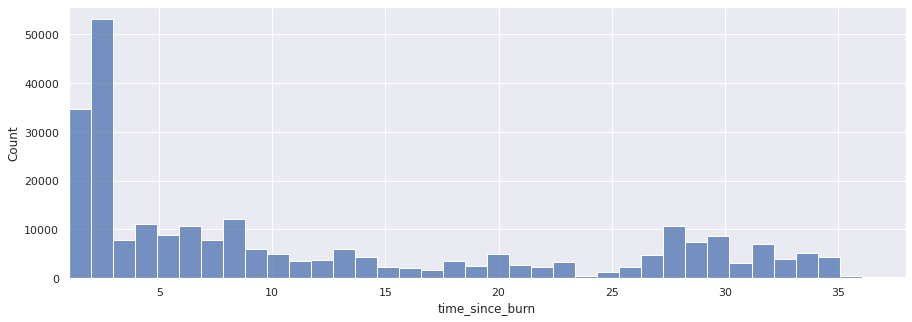

In [103]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
g = sns.histplot(gedi_burned_trees, x='time_since_burn', bins=38)
ax.margins(x=0)

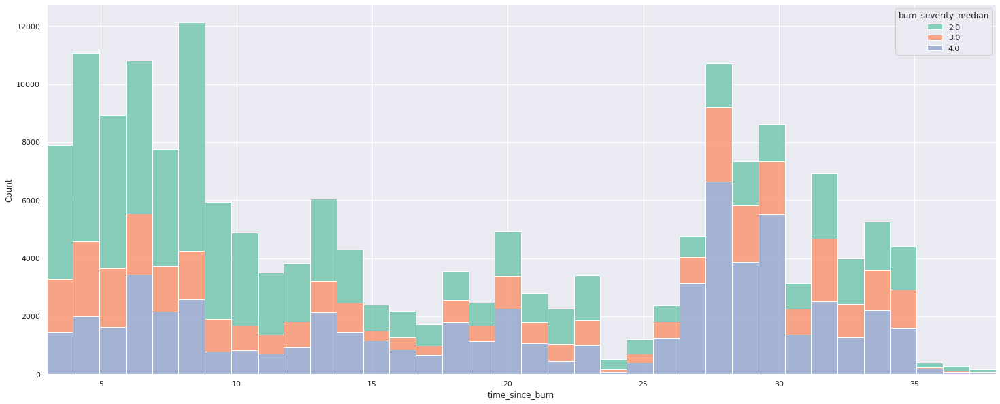

In [101]:
fig, ax = plt.subplots(1, 1, figsize=(25, 10))
sns.histplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn', hue='burn_severity_median', palette='Set2', multiple="stack", bins=36)
ax.margins(x=0)

### Boxplot comparisons

(0.0, 1000.0)

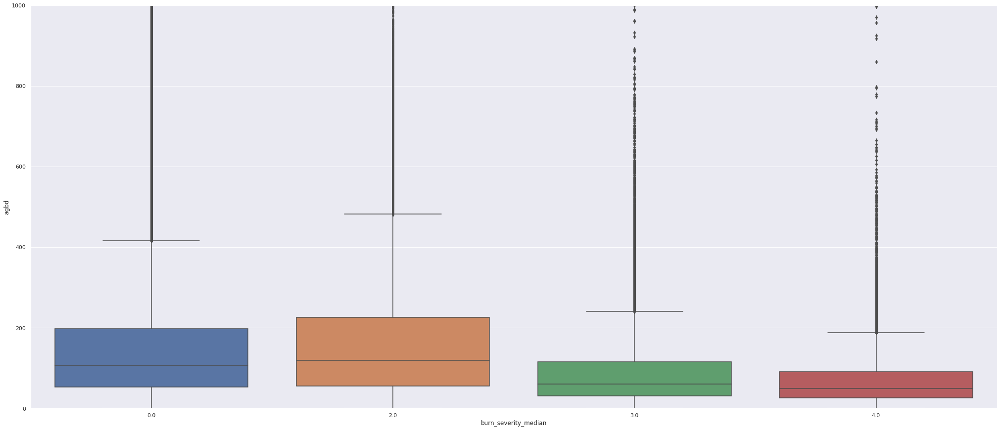

In [104]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees, x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1000))

(0.0, 1000.0)

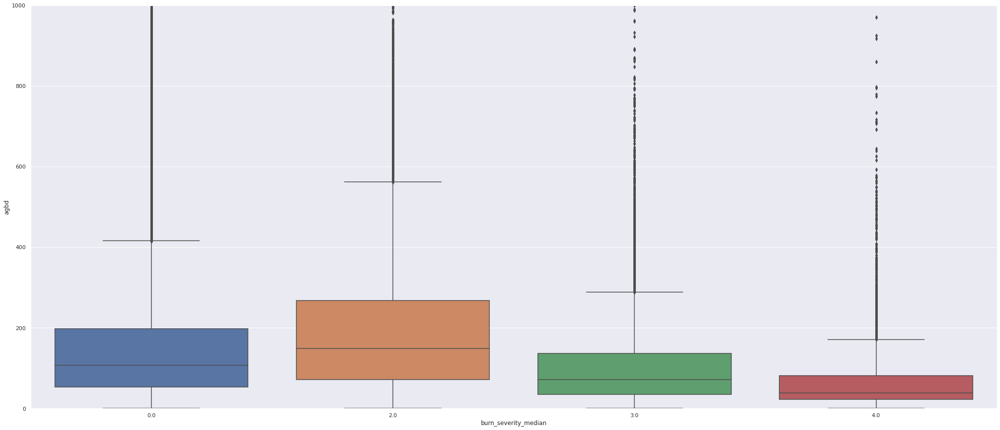

In [105]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees[gedi_trees.time_since_burn_cat.isin(['unburned', 'burn_10'])], x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1000))

(0.0, 1000.0)

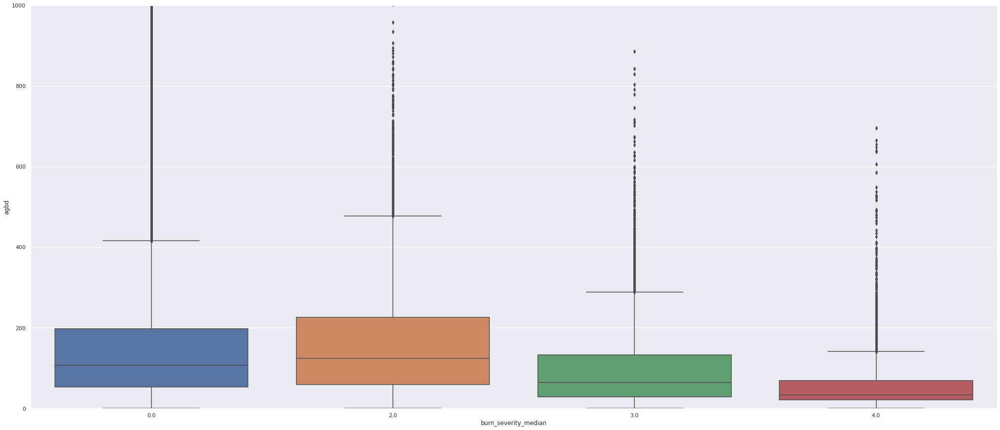

In [106]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees[gedi_trees.time_since_burn_cat.isin(['unburned', 'burn_20'])], x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1000))

(0.0, 1000.0)

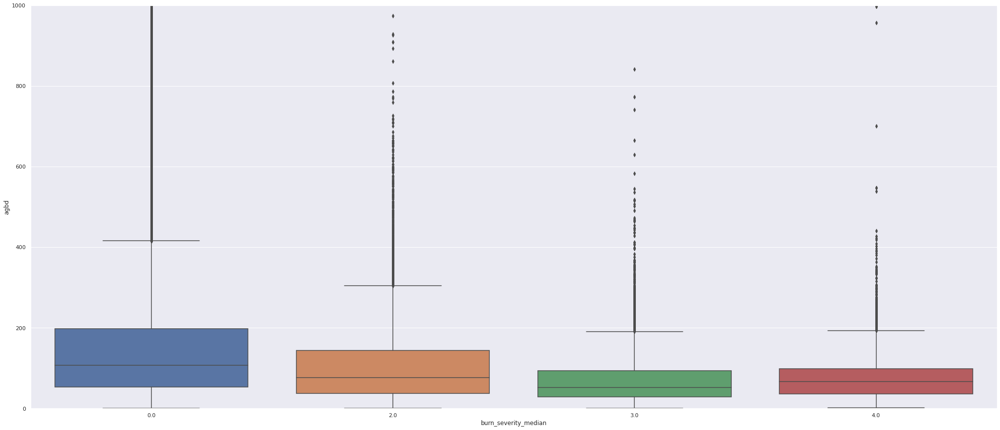

In [107]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees[gedi_trees.time_since_burn_cat.isin(['unburned', 'burn_30'])], x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1000))

(0.0, 1000.0)

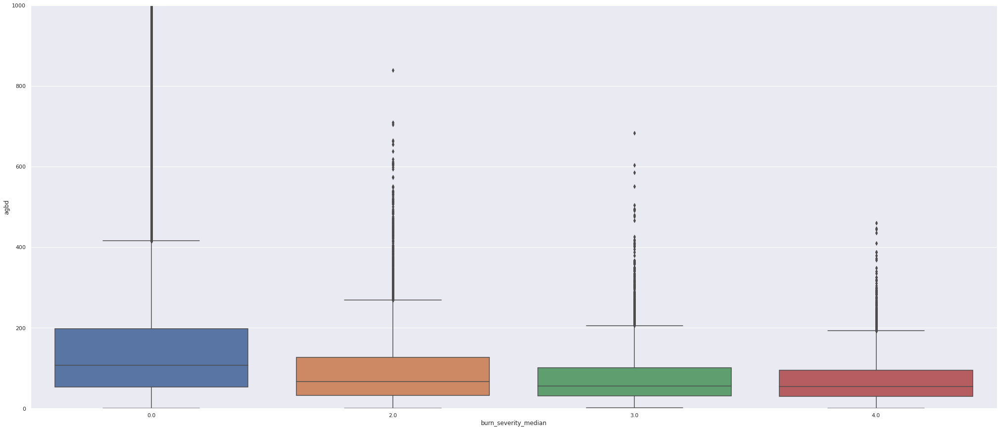

In [108]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees[gedi_trees.time_since_burn_cat.isin(['unburned', 'burn_40'])], x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1000))

# AGBD timeplots

<AxesSubplot: xlabel='time_since_burn', ylabel='agbd'>

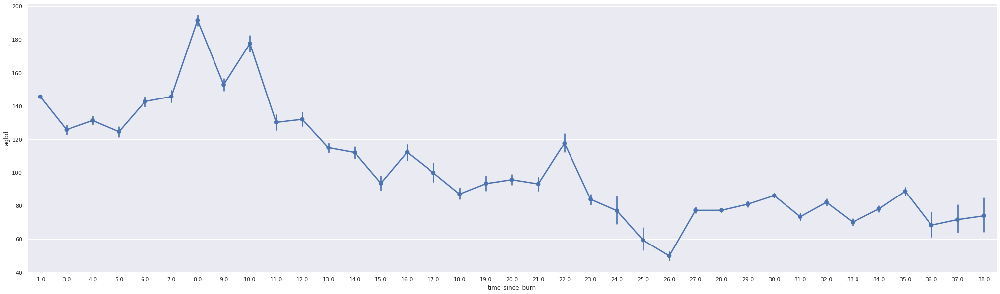

In [109]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_trees, x='time_since_burn', y='agbd')

<AxesSubplot: xlabel='time_since_burn', ylabel='agbd'>

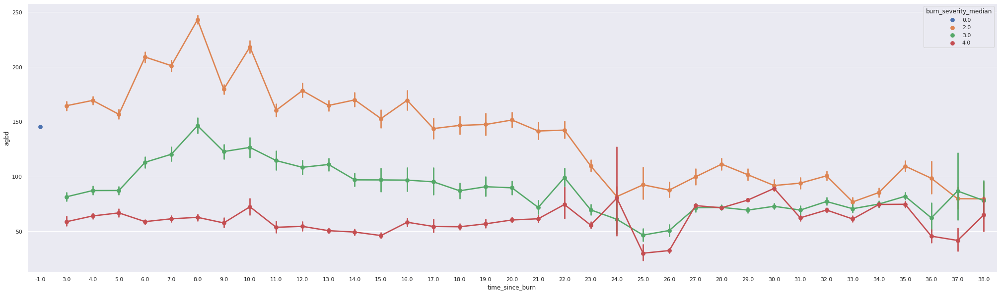

In [110]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_trees, x='time_since_burn', y='agbd', hue='burn_severity_median')

Text(0, 0.5, 'GEDI AGBD')

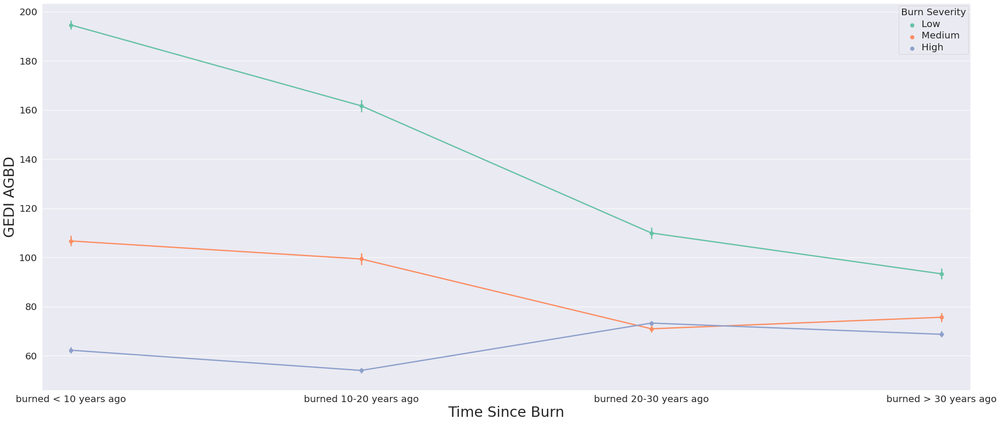

In [111]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
g = sns.pointplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn_cat', y='agbd', hue='burn_severity_median', palette='Set2')
g.get_legend().set_title('Burn Severity')
new_labels = ['Low', 'Medium', 'High']
for t, l in zip(g.get_legend().texts, new_labels):
    t.set_text(l)

plt.setp(g.get_legend().get_texts(), fontsize='20') 
plt.setp(g.get_legend().get_title(), fontsize='20') 

#plt.legend(title='Burn Severity', loc='upper right', labels=['Low', 'Medium', 'High'])
ax.set_xticks([1, 2, 3, 4])
ax.set_xlim((0.9, 4.1))
ax.set_xticklabels(['burned < 10 years ago', 'burned 10-20 years ago', 'burned 20-30 years ago', 'burned > 30 years ago'])
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time Since Burn', fontsize=30)
ax.set_ylabel('GEDI AGBD', fontsize=30)

Text(0, 0.5, 'GEDI AGBD')

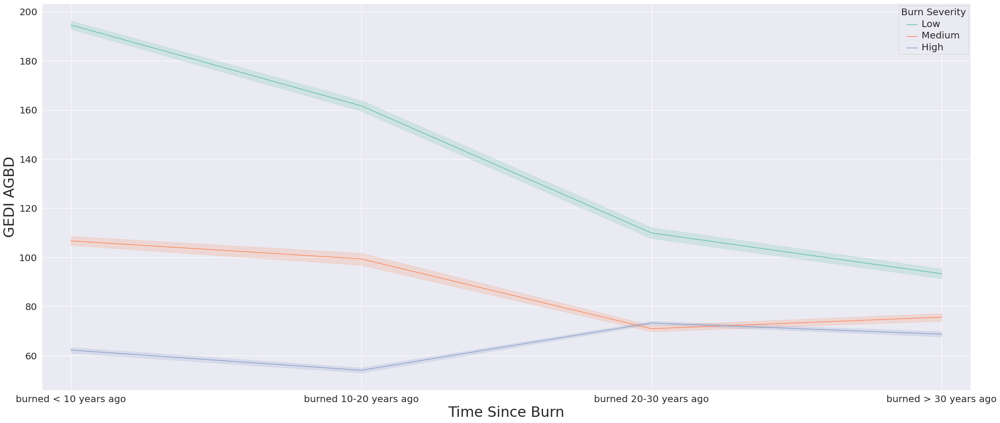

In [112]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
g = sns.lineplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn_cat', y='agbd', hue='burn_severity_median', palette='Set2')
g.get_legend().set_title('Burn Severity')
new_labels = ['Low', 'Medium', 'High']
for t, l in zip(g.get_legend().texts, new_labels):
    t.set_text(l)

plt.setp(g.get_legend().get_texts(), fontsize='20') 
plt.setp(g.get_legend().get_title(), fontsize='20') 

#plt.legend(title='Burn Severity', loc='upper right', labels=['Low', 'Medium', 'High'])
ax.set_xticks([1, 2, 3, 4])
ax.set_xlim((0.9, 4.1))
ax.set_xticklabels(['burned < 10 years ago', 'burned 10-20 years ago', 'burned 20-30 years ago', 'burned > 30 years ago'])
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time Since Burn', fontsize=30)
ax.set_ylabel('GEDI AGBD', fontsize=30)

Text(0, 0.5, 'GEDI AGBD')

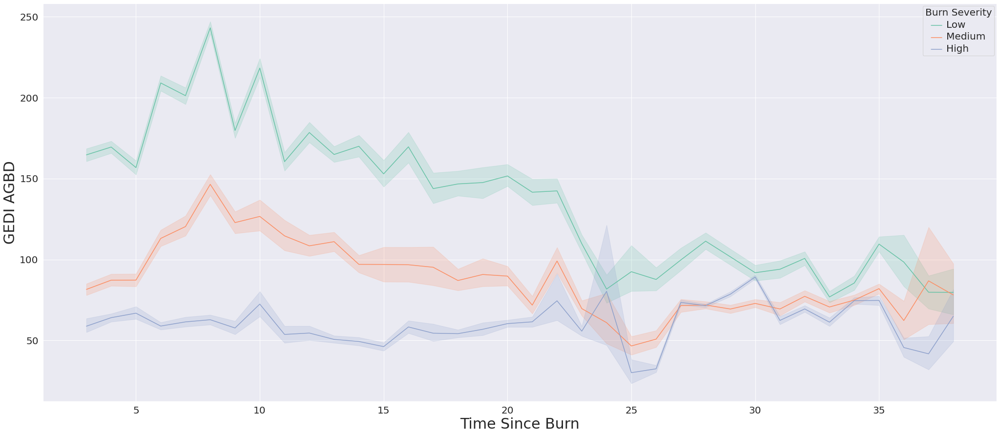

In [113]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
g = sns.lineplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn', y='agbd', hue='burn_severity_median', palette='Set2')
g.get_legend().set_title('Burn Severity')
new_labels = ['Low', 'Medium', 'High']
for t, l in zip(g.get_legend().texts, new_labels):
    t.set_text(l)

plt.setp(g.get_legend().get_texts(), fontsize='20') 
plt.setp(g.get_legend().get_title(), fontsize='20') 

#plt.legend(title='Burn Severity', loc='upper right', labels=['Low', 'Medium', 'High'])
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time Since Burn', fontsize=30)
ax.set_ylabel('GEDI AGBD', fontsize=30)

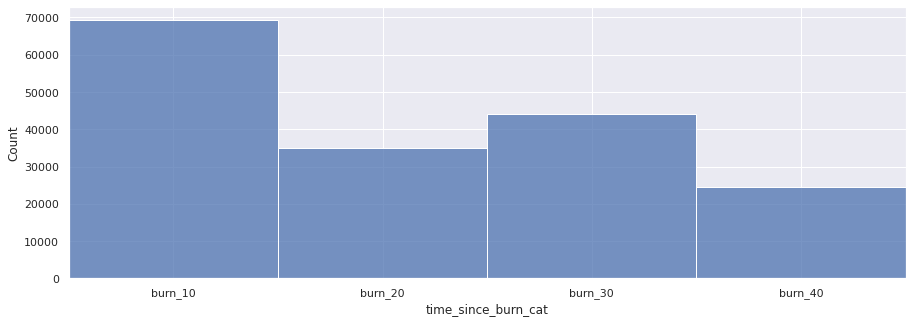

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
g = sns.histplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn_cat')
ax.margins(x=0)

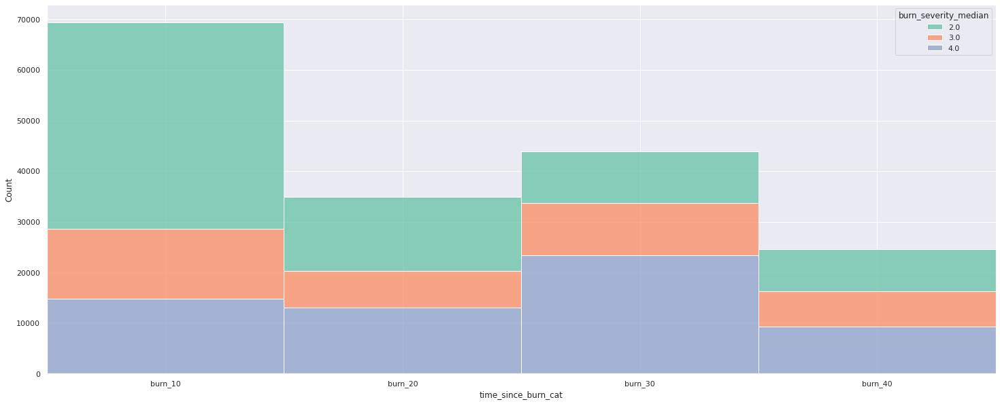

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(25, 10))
sns.histplot(gedi_trees[gedi_trees.time_since_burn != -1], x='time_since_burn_cat', hue='burn_severity_median', palette='Set2', multiple="stack")
ax.margins(x=0)

In [116]:
gedi_burned_trees[gedi_burned_trees.burn_severity_median == 2].shape[0]

108723

Hypothesis to explain above: pixels that burned with low and medium severity > 30 years ago are more likely to reburn, than the ones that burned with high severity due to fuel reduction.

What percentage of each severity category reburns? Fire return interval must depend on the severity of the previous burn?

In [64]:
def plot_pdf(df: pd.DataFrame, x_col: str, y_col:str, x_label: str, y_label: str, y_lim: tuple):
    n = len(df)
    print(n)

    x = df[x_col].values
    y = df[y_col].values

    # Calculate the point density distribution per age group
    x_values = np.unique(x)
    z = np.zeros(y.shape)
    for i in x_values:
        z[x == i] = gaussian_kde(y[x == i])(y[x == i])


    # Sort the points by density, so that the densest points are plotted last
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]

    # limit to only the points with high enough density
    # x = x[z > 0.005]
    # y = y[z > 0.005]
    # z = z[z > 0.005]

    fig, ax = plt.subplots(1, 1, figsize=(25, 10))
    im = ax.scatter(x, y, c=z, s=500, cmap='PuRd')
    ax.set_ylim(y_lim)
    ax.set_xticks(x_values[::2])
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_xlabel(x_label, size=15)
    ax.set_ylabel(y_label, size=15)
    plt.colorbar(im)

    plt.show()

108723


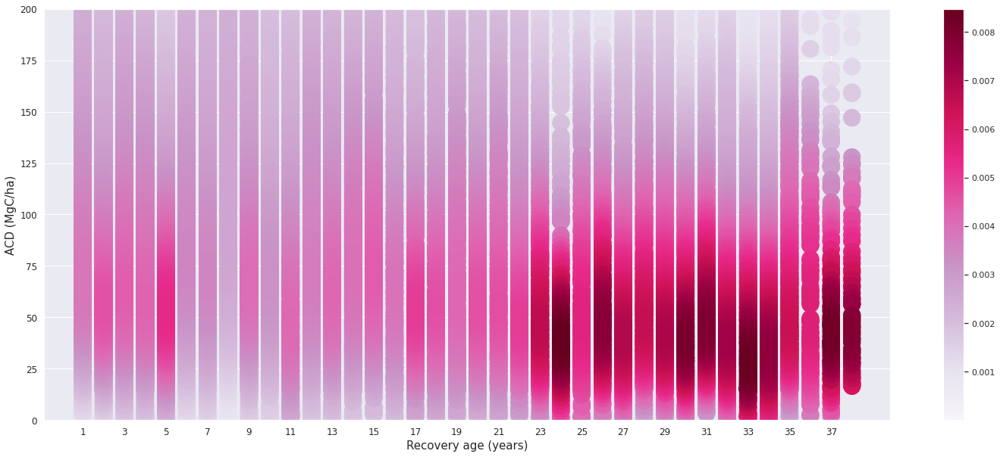

In [118]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 2],
         'time_since_burn',
         'agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 200))

57017


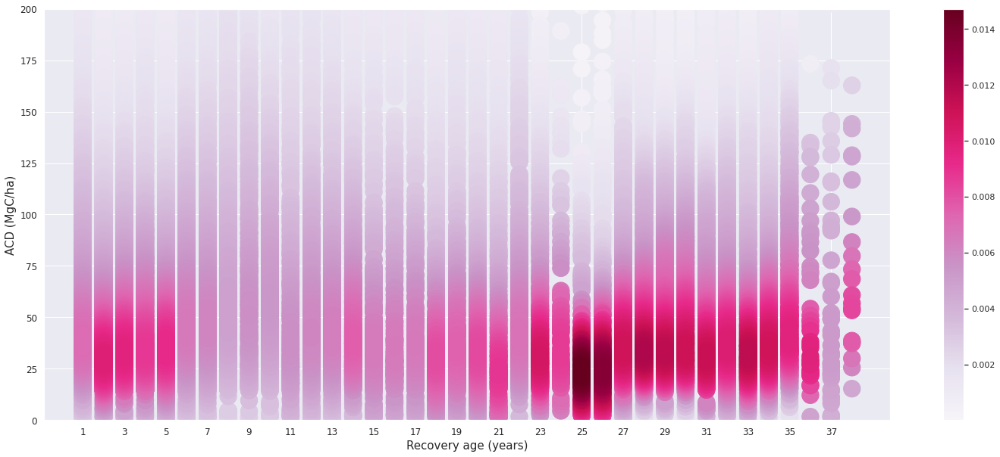

In [119]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 3],
         'time_since_burn',
         'agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 200))

94900


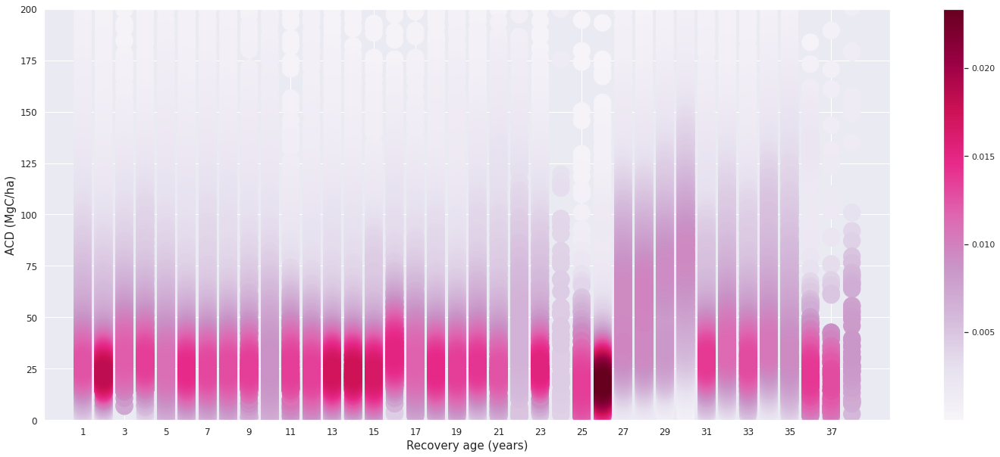

In [120]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 4],
         'time_since_burn',
         'agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 200))

### Calculate statistics of absolute AGBD values

In [18]:
gedi_trees

,shot_number,absolute_time,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,beam_type,sensitivity,pft_class,geometry,burn_severity_median,burn_year_median,burn_counts_median,gedi_year,gedi_month,time_since_burn,time_since_burn_cat
30377,141320600300524403,2021-06-11 01:03:13.232091+00:00,-121.065232,38.523326,29.816301,6.703417,69.418312,2.982733,full,0.966228,6,POINT (-121.06523 38.52333),2.0,2017.0,1.0,2021,6,4.0,burn_10
30378,141320600300524405,2021-06-11 01:03:13.248619+00:00,-121.064224,38.522668,28.796034,6.224873,67.855049,2.982503,full,0.965935,6,POINT (-121.06422 38.52267),2.0,2017.0,1.0,2021,6,4.0,burn_10
30379,141320600300524406,2021-06-11 01:03:13.256883+00:00,-121.063721,38.522340,48.694904,16.833782,97.090446,2.990923,full,0.963867,6,POINT (-121.06372 38.52234),2.0,2017.0,1.0,2021,6,4.0,burn_10
30381,141320600300524408,2021-06-11 01:03:13.273411+00:00,-121.062714,38.521683,21.426817,3.090621,56.247093,2.981820,full,0.962257,6,POINT (-121.06271 38.52168),2.0,2017.0,1.0,2021,6,4.0,burn_10
30479,169790800200082537,2021-12-11 17:35:08.887395+00:00,-121.066418,38.526989,16.838388,1.518356,48.646515,2.982546,full,0.957908,6,POINT (-121.06642 38.52699),2.0,2017.0,1.0,2021,12,4.0,burn_10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27623252,192410600300534401,2022-05-06 14:47:14.435166+00:00,-119.970015,36.863622,21.251682,3.024314,55.963173,2.981828,full,0.968922,8,POINT (-119.97001 36.86362),0.0,0.0,0.0,2022,5,-1.0,unburned
27623277,42030600300533058,2019-09-09 14:31:54.505967+00:00,-119.971450,36.864930,18.489573,2.041736,51.423347,2.982156,full,0.971968,8,POINT (-119.97145 36.86493),0.0,0.0,0.0,2019,9,-1.0,unburned
27623278,42030600300533061,2019-09-09 14:31:54.530760+00:00,-119.970006,36.863913,20.158594,2.620811,54.180977,2.981914,full,0.975002,8,POINT (-119.97001 36.86391),0.0,0.0,0.0,2019,9,-1.0,unburned
27626190,187680500300286974,2022-04-06 02:51:43.105139+00:00,-119.885997,36.855828,43.790302,14.013438,90.086578,2.988213,full,0.957947,6,POINT (-119.88600 36.85583),0.0,0.0,0.0,2022,4,-1.0,unburned


In [21]:
from scipy import stats

def AB_test(test_raw: pd.Series, control_raw: pd.Series, confidence=0.95, h0=0): 
    # Remove outliers
    
    mu1, mu2 = test.mean(), control.mean()
    se1, se2 = test.std() / np.sqrt(len(test)), control.std() / np.sqrt(len(control))
    diff = mu1 - mu2
    se_diff = np.sqrt(test.var()/len(test) + control.var()/len(control))
    z_stats = (diff-h0)/se_diff
    p_value = stats.norm.cdf(z_stats)
    def critial(se): 
        return -se*stats.norm.ppf((1 - confidence)/2)
    print(f"Test Mean {mu1}, Test STD {test.std()}")
    print(f"Control Mean {mu2}, Control STD {control.std()}") 
    print(f"Test {confidence*100}% CI: {mu1} +- {critial(se1)}") 
    print(f"Control {confidence*100}% CI: {mu2} +- {critial(se2)}") 
    print(f"Test-Control {confidence*100}% CI: {diff} +- {critial(se_diff)}") 
    print(f"Z Statistic {z_stats}")
    print(f"P-Value {p_value}")

In [15]:
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10'].time_since_burn.unique()

array([ 4.,  3.,  2.,  6.,  5.,  7.,  1., 10.,  8.,  9.])

In [16]:
gedi_trees.time_since_burn_cat.unique()

['burn_10', 'burn_20', 'burn_30', 'burn_40', 'unburned']
Categories (5, object): ['unburned' < 'burn_10' < 'burn_20' < 'burn_30' < 'burn_40']

In [17]:
burned_un = gedi_trees[gedi_trees.time_since_burn_cat == 'unburned']
burn_10 = gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10']
burn_20 = gedi_trees[gedi_trees.time_since_burn_cat == 'burn_20']
burn_30 = gedi_trees[gedi_trees.time_since_burn_cat == 'burn_30']
burn_40 = gedi_trees[gedi_trees.time_since_burn_cat == 'burn_40']

(0.0, 600.0)

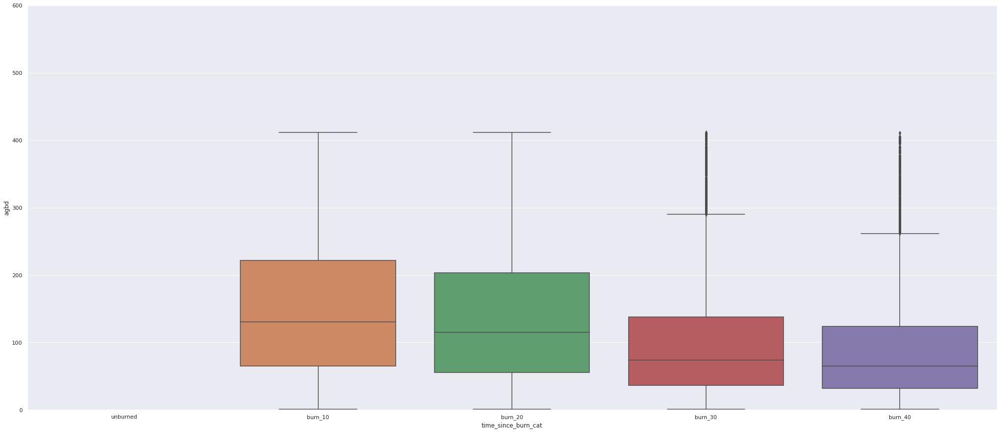

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees_no[gedi_trees_no.burn_severity_median==2], x='time_since_burn_cat', y="agbd", ax=ax)
ax.set_ylim((0, 600))

(0.0, 500.0)

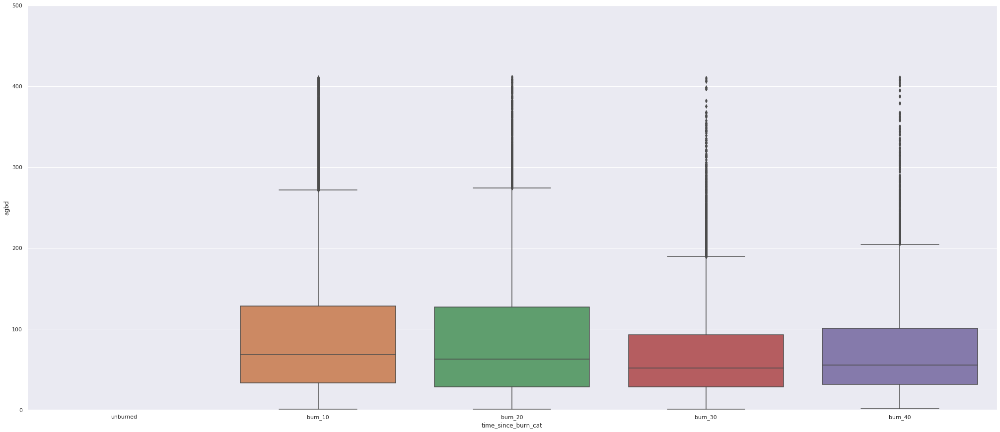

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees_no[gedi_trees_no.burn_severity_median==3], x='time_since_burn_cat', y="agbd", ax=ax)
ax.set_ylim((0, 500))

(0.0, 500.0)

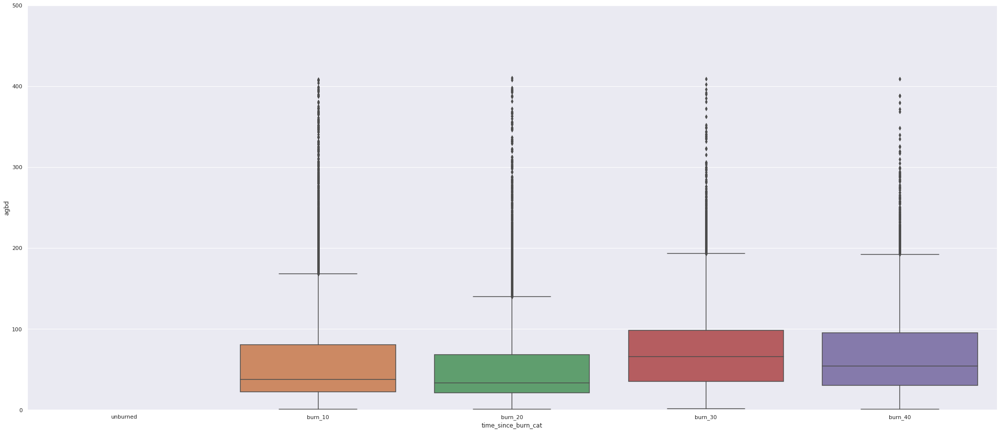

In [53]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees_no[gedi_trees_no.burn_severity_median==4], x='time_since_burn_cat', y="agbd", ax=ax)
ax.set_ylim((0, 500))

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_trees[gedi_trees.burn_severity_median==4], x='time_since_burn_cat', y="agbd", ax=ax)
ax.set_ylim((0, 600))

(0.0, 1000.0)

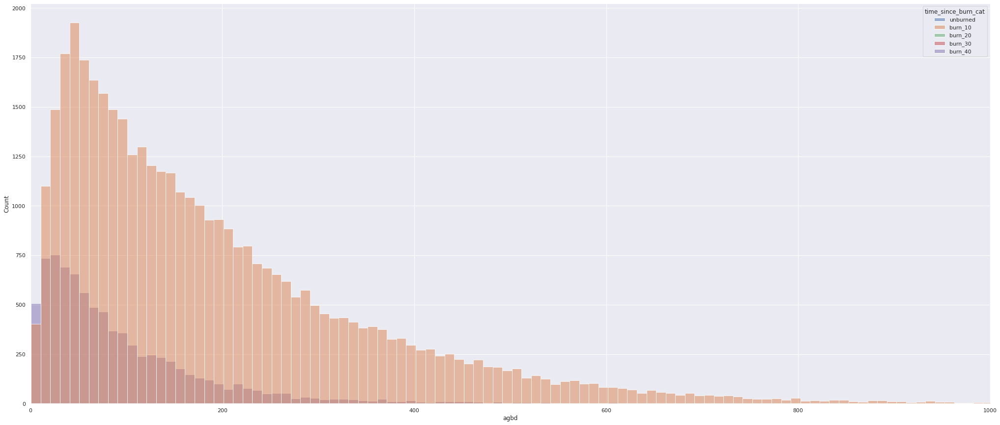

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.histplot(gedi_trees[(gedi_trees.burn_severity_median == 2) & (gedi_trees.time_since_burn_cat.isin(['burn_10', 'burn_40']) )], x='agbd', hue="time_since_burn_cat", ax=ax)
ax.set_xlim((0, 1000))

In [35]:
burn_2.time_since_burn_cat.unique()

['burn_10', 'burn_20', 'burn_30', 'burn_40']
Categories (5, object): ['unburned' < 'burn_10' < 'burn_20' < 'burn_30' < 'burn_40']

In [22]:
AB_test(burn_10[burn_10.burn_severity_median==4].agbd, burn_30[burn_30.burn_severity_median==4].agbd)

Test Mean 64.04235910736357, Test STD 73.20590944646106
Control Mean 73.24601712325043, Control STD 53.27346799228679
Test 95.0% CI: 64.04235910736357 +- 0.6477777598083788
Control 95.0% CI: 73.24601712325043 +- 0.6824158069128156
Test-Control 95.0% CI: -9.203658015886859 +- 0.9409077317286912
Z Statistic -19.17173983045032
P-Value 3.187048657908033e-82


(0.0, 1000.0)

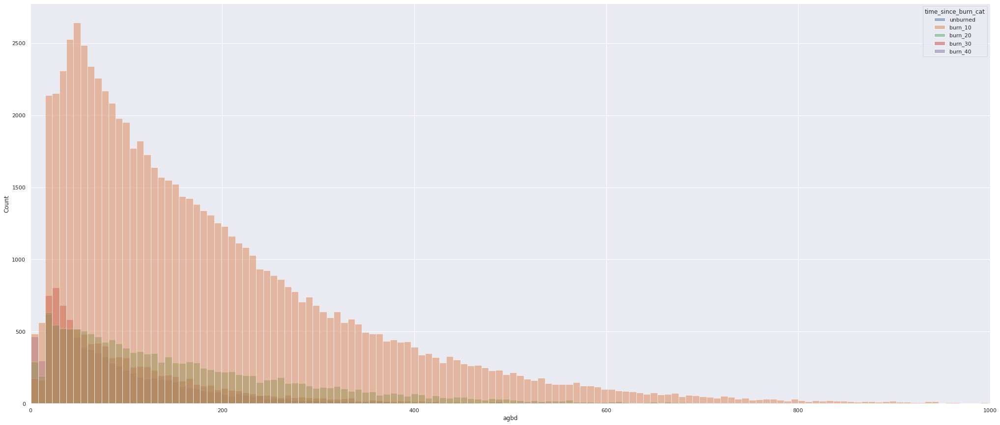

In [37]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.histplot(burn_2, x='agbd', hue="time_since_burn_cat", ax=ax)
ax.set_xlim((0, 1000))

In [ ]:
AB_test(burn_10[burn_10.burn_severity_median==4], burn_30[burn_30.burn_severity_median==4].agbd)

In [23]:
AB_test(burn_20[burn_20.burn_severity_median==4].agbd, burn_30[burn_30.burn_severity_median==4].agbd)

Test Mean 53.975123925538426, Test STD 57.36901180632078
Control Mean 73.24601712325043, Control STD 53.27346799228679
Test 95.0% CI: 53.975123925538426 +- 0.9818039073360932
Control 95.0% CI: 73.24601712325043 +- 0.6824158069128156
Test-Control 95.0% CI: -19.270893197712 +- 1.19567146239462
Z Statistic -31.58915956879108
P-Value 2.6009637772890076e-219


In [45]:
burn_20[burn_20.burn_severity_median==4].agbd.mean(), burn_20[burn_20.burn_severity_median==4].agbd.std()

(53.975123925538426, 57.36901180632078)

In [46]:
burn_20[(burn_20.burn_severity_median==4) & (burn_20.agbd < 500)].agbd.mean(), burn_20[(burn_20.burn_severity_median==4) & (burn_20.agbd < 500)].agbd.std()

(53.125179098314646, 51.73121314699502)

In [47]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    filtered = df.query(f'(@Q1 - 1.5 * @IQR) <= {column} <= (@Q3 + 1.5 * @IQR)')
    return filtered

test_df = burn_20[burn_20.burn_severity_median==4]
print(test_df.agbd.mean(), test_df.agbd.std())
test_df_no_outliers = remove_outliers(test_df, 'agbd')
print(test_df_no_outliers.agbd.mean(), test_df_no_outliers.agbd.std())


53.975123925538426 57.36901180632078
43.161592935724514 31.960896340401995


In [25]:
np.random.seed(123)
n1 = np.random.normal(53, sqr(57), 30000)
n2 = np.random.normal(1, 4, 30000)
n_diff = n2 - n1
sns.distplot(n1, hist=False, label="$N(4,3^2)$")
sns.distplot(n2, hist=False, label="$N(1,4^2)$")
sns.distplot(n_diff, hist=False, label=f"$N(1,4^2) - (4,3^2) = N(-3, 5^2)$")
plt.legend()
plt.show()

NameError: name 'sqr' is not defined

### Find nearest neighbours

In [54]:
gedi_burned_trees = gedi_trees_no[gedi_trees_no.burn_severity_median != 0]
gedi_unburned_trees = gedi_trees_no[gedi_trees_no.burn_severity_median == 0]
gedi_burned_trees.shape[0], gedi_unburned_trees.shape[0]

(166784, 3006663)

In [55]:
nn_indeces, nn_distances, nn_avg_agbd = k_nn.nearest_neighbors(gedi_burned_trees, gedi_unburned_trees, 'agbd', 200)

In [58]:
nn_distances.shape

(166784, 200)

In [56]:
gedi_burned_trees['rel_agbd'] = gedi_burned_trees.agbd / nn_avg_agbd

In [57]:
gedi_burned_trees['nn_avg_agbd'] = nn_avg_agbd

In [59]:
gedi_burned_trees['nn_index'] = range(0, 166784)

In [60]:
gedi_burned_trees.to_csv('/maps/fire-regen/data/burned_trees_rel_agbd_200_nn_no.csv')

In [13]:
nn_avg_agbd

array([67.29158959, 67.29158959, 67.29158959, 67.29158959, 67.29158959,
       67.29158959, 67.29158959, 67.29158959, 60.96015707, 60.96015707])

<AxesSubplot: xlabel='time_since_burn', ylabel='rel_agbd'>

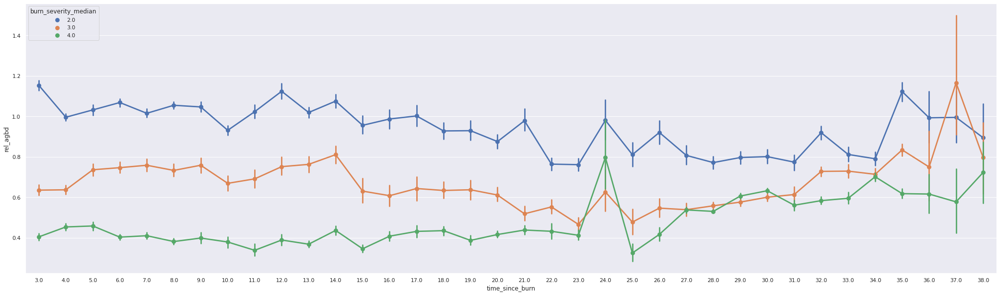

In [61]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_burned_trees, x='time_since_burn', y='rel_agbd', hue='burn_severity_median')

In [ ]:
gedi_burned_trees[gedi_burned_trees.agbd < 100].plot()

<AxesSubplot: xlabel='time_since_burn', ylabel='nn_avg_agbd'>

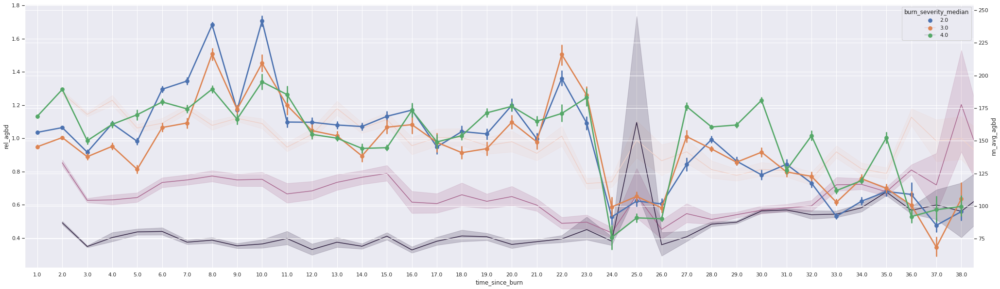

In [200]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.lineplot(gedi_burned_trees, x='time_since_burn', y='rel_agbd', hue='burn_severity_median')
ax_twin = ax.twinx()
sns.pointplot(gedi_burned_trees, x='time_since_burn', y='nn_avg_agbd', hue='burn_severity_median', ax=ax_twin)

<AxesSubplot: xlabel='time_since_burn', ylabel='agbd'>

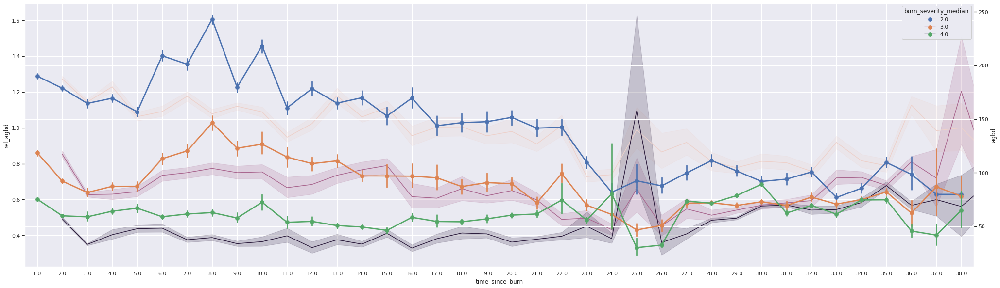

In [201]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.lineplot(gedi_burned_trees, x='time_since_burn', y='rel_agbd', hue='burn_severity_median')
ax_twin = ax.twinx()
sns.pointplot(gedi_burned_trees, x='time_since_burn', y='agbd', hue='burn_severity_median', ax=ax_twin)

<AxesSubplot: xlabel='time_since_burn', ylabel='Count'>

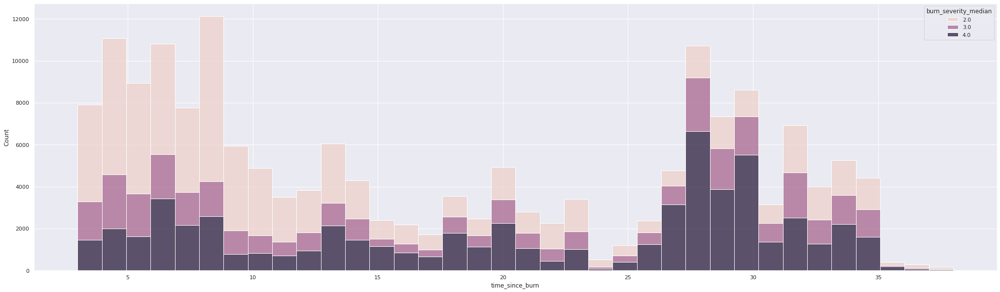

In [165]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.histplot(gedi_burned_trees[gedi_burned_trees.time_since_burn > 2], x='time_since_burn', hue='burn_severity_median', bins=36, multiple="stack")

<AxesSubplot: >

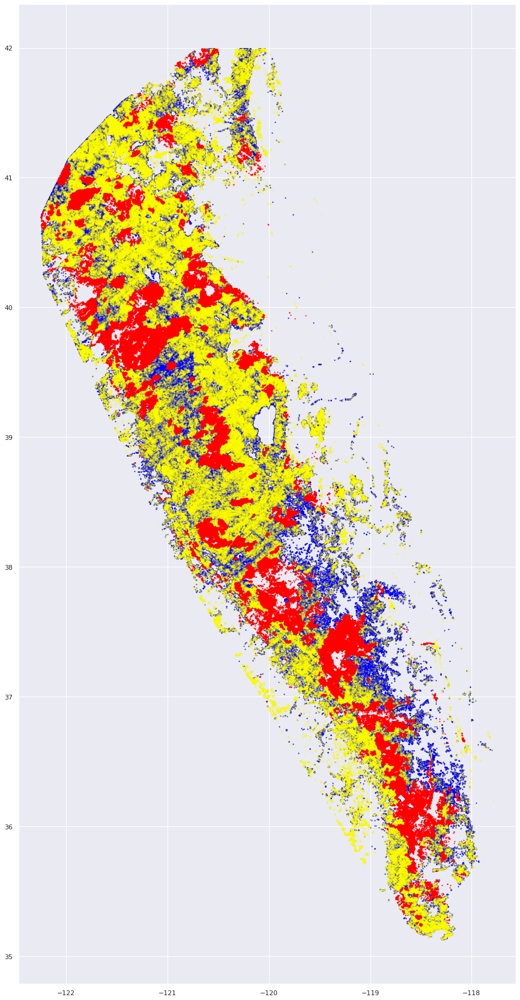

In [225]:
fig, ax = plt.subplots(1, 1, figsize=(36, 30))
gedi_unburned_trees[gedi_unburned_trees.agbd > 40].plot(ax=ax, color='blue', markersize=1)
gedi_unburned_trees[gedi_unburned_trees.agbd < 40].plot(ax=ax, color='yellow', markersize=2, alpha=0.2)
gedi_burned_trees.plot(ax=ax, color='red', markersize=1)

<AxesSubplot: >

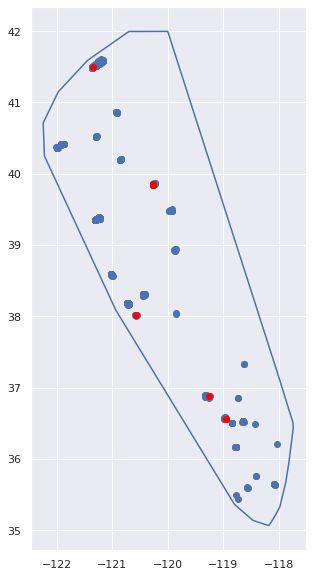

In [205]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
sierras.boundary.plot(ax=ax)
gedi_year = gedi_burned_trees[gedi_burned_trees.time_since_burn == 24]
gedi_large = gedi_year[gedi_year.rel_agbd > 5]
gedi_burned_trees[gedi_burned_trees.time_since_burn == 24].plot(ax=ax)
gedi_large.plot(ax=ax, color='red')

<AxesSubplot: xlabel='lat_lowestmode', ylabel='rel_agbd'>

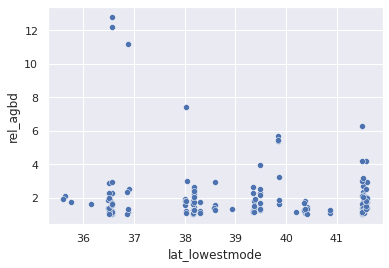

In [175]:
sns.scatterplot(gedi_large, x='lat_lowestmode', y='rel_agbd')

<AxesSubplot: xlabel='lat_lowestmode', ylabel='rel_agbd'>

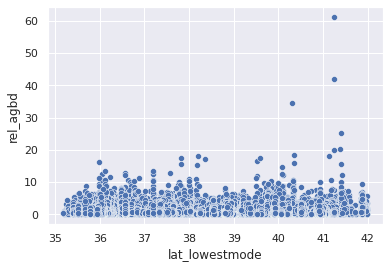

In [183]:
sns.scatterplot(gedi_burned_trees, x='lat_lowestmode', y='rel_agbd')

In [208]:
gedi_large[gedi_large.rel_agbd > 6][['shot_number', 'agbd', 'rel_agbd', 'nn_avg_agbd', 'nn_index']]

,shot_number,agbd,rel_agbd,nn_avg_agbd,nn_index
177674,110630500200178256,387.471466,6.296899,61.533699,311
2170209,115050800200084113,773.376221,7.397094,104.551359,18146
18797838,211940800300289072,659.101746,11.153498,59.093727,184806
27326000,76920500200080199,997.288147,12.809229,77.856999,259197
27326001,76920500200080200,997.727234,12.176228,81.940585,259198


In [207]:
nn_distances[184806]

array([ 448.45690828,  524.92538794,  526.96099738,  574.14205826,
        797.24623837,  804.24894881,  815.09299027,  897.95435393,
        898.39465912,  902.8241505 ,  922.34106779,  936.59507858,
        941.75489543,  942.38081257,  944.58134485,  950.70993148,
        954.11862364,  960.24755983,  973.01609658,  989.07582043,
       1007.93432608, 1029.2485706 , 1039.53356386, 1047.07921762,
       1050.9410416 , 1053.24644175, 1060.59632098, 1079.90886178,
       1081.95449342, 1083.46854042, 1090.80941809, 1108.92993652,
       1114.96737658, 1116.82556526, 1141.79401349, 1143.47353976,
       1144.17634891, 1145.50076433, 1147.42963602, 1149.62290345,
       1150.08445373, 1157.14110844, 1186.38105157, 1194.12745645,
       1224.79424299, 1255.89902382, 1264.81252491, 1302.93527343,
       1306.80163556, 1325.2808642 , 1328.73689308, 1334.55379914,
       1350.69385861, 1443.53316322, 1459.83364295, 1506.83234587,
       1537.71215836, 1562.23576332, 1571.3651934 , 1595.64569

In [209]:
test_sample_burned = gedi_burned_trees[gedi_burned_trees.shot_number==211940800300289072]
test_sample_unburned_nns = gedi_unburned_trees.reset_index(drop=True).loc[nn_indeces[184806].flatten()]

<AxesSubplot: xlabel='lat_lowestmode', ylabel='agbd'>

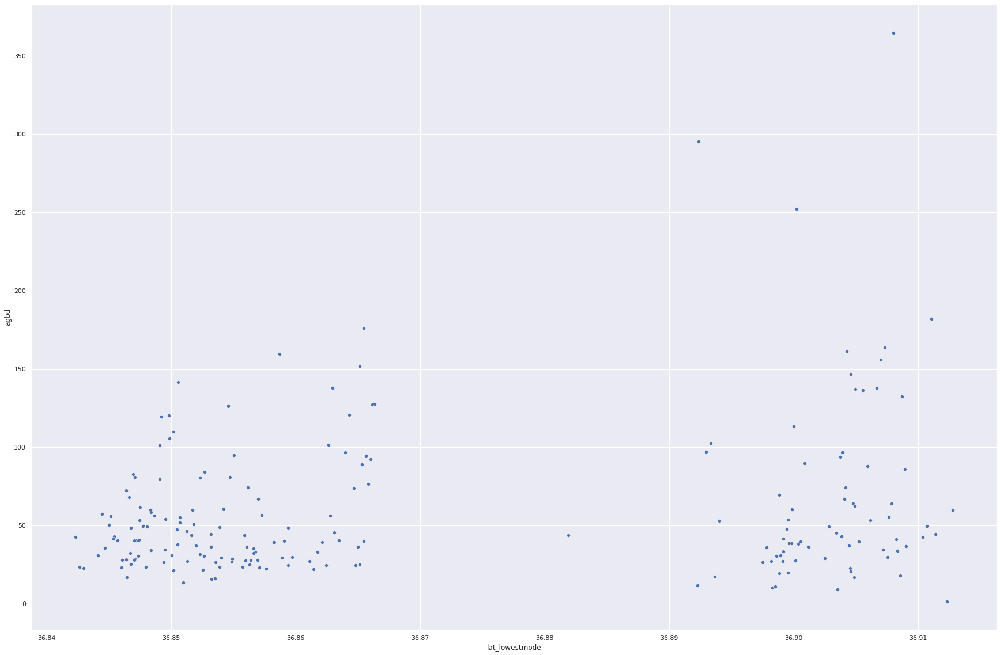

In [223]:
fig, ax = plt.subplots(1, 1, figsize=(30, 20))
sns.scatterplot(test_sample_unburned_nns, x='lat_lowestmode', y='agbd')

(36.92, 36.84)

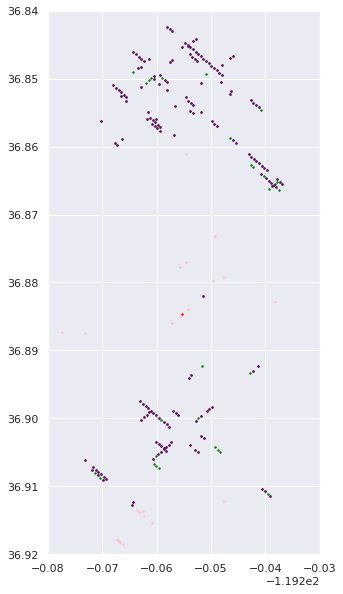

In [218]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
#sierras.boundary.plot(ax=ax)
gedi_burned_trees.plot(ax=ax, markersize=2, color='pink')
#gedi_unburned_trees.plot(ax=ax, markersize=2, color='yellow')
test_sample_unburned_low = test_sample_unburned_nns[test_sample_unburned_nns.agbd < 100]
test_sample_unburned_nns.plot(ax=ax, markersize=2, color='green')
test_sample_unburned_low.plot(ax=ax, markersize=2, color='purple')
test_sample_burned.plot(ax=ax, markersize=2, color='red')
ax.set_xlim((-119.28, -119.23))
ax.set_ylim((36.92, 36.84))


In [195]:
gedi_large[gedi_large.rel_agbd < 6][['agbd', 'rel_agbd']]

,agbd,rel_agbd
15112558,271.409790,5.374352
26395293,334.493835,5.665212
26470694,291.064880,5.440860


<AxesSubplot: xlabel='lat_lowestmode', ylabel='agbd'>

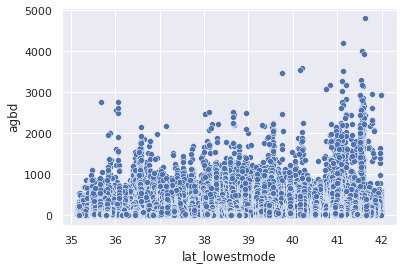

In [177]:
sns.scatterplot(gedi_unburned_trees, x='lat_lowestmode', y='agbd')

<AxesSubplot: xlabel='lon_lowestmode', ylabel='agbd'>

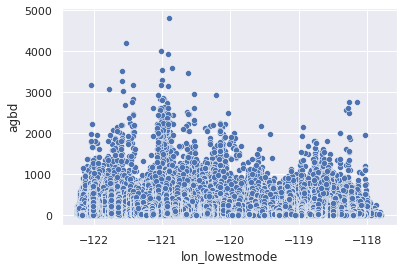

In [178]:
sns.scatterplot(gedi_unburned_trees, x='lon_lowestmode', y='agbd')

In [22]:
gedi_burned_trees = gedi_pipeline.add_time_since_burn_categories(gedi_burned_trees)

Text(0, 0.5, 'GEDI AGBD')

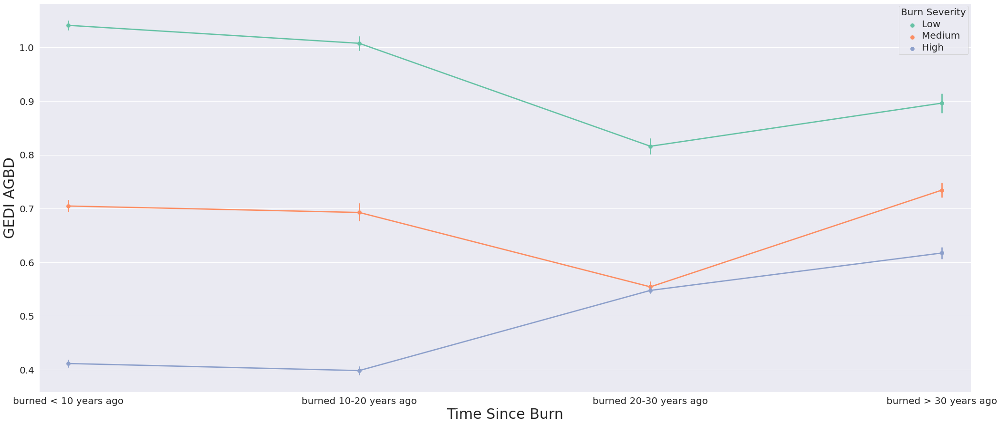

In [62]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
g = sns.pointplot(gedi_burned_trees, x='time_since_burn_cat', y='rel_agbd', hue='burn_severity_median', palette='Set2')
g.get_legend().set_title('Burn Severity')
new_labels = ['Low', 'Medium', 'High']
for t, l in zip(g.get_legend().texts, new_labels):
    t.set_text(l)

plt.setp(g.get_legend().get_texts(), fontsize='20') 
plt.setp(g.get_legend().get_title(), fontsize='20') 

#plt.legend(title='Burn Severity', loc='upper right', labels=['Low', 'Medium', 'High'])
ax.set_xticks([1, 2, 3, 4])
ax.set_xlim((0.9, 4.1))
ax.set_xticklabels(['burned < 10 years ago', 'burned 10-20 years ago', 'burned 20-30 years ago', 'burned > 30 years ago'])
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time Since Burn', fontsize=30)
ax.set_ylabel('GEDI AGBD', fontsize=30)

67252


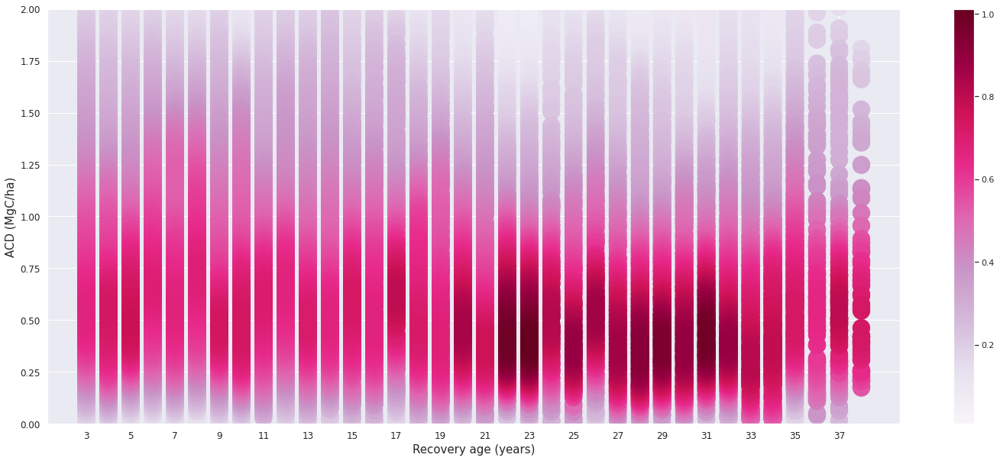

In [71]:
plot_pdf(gedi_burned_trees[(gedi_burned_trees.burn_severity_median == 2) & (gedi_burned_trees.rel_agbd < 3)],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 2))

37719


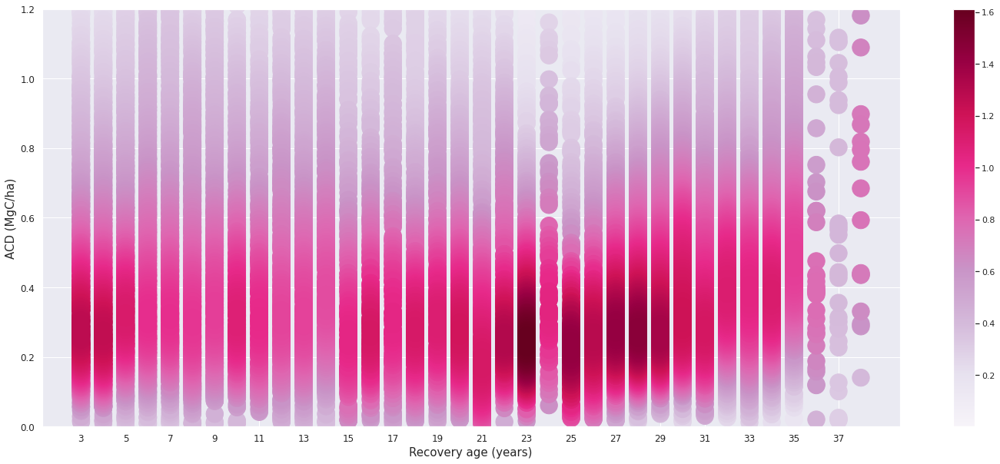

In [66]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 3],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1.2))

60563


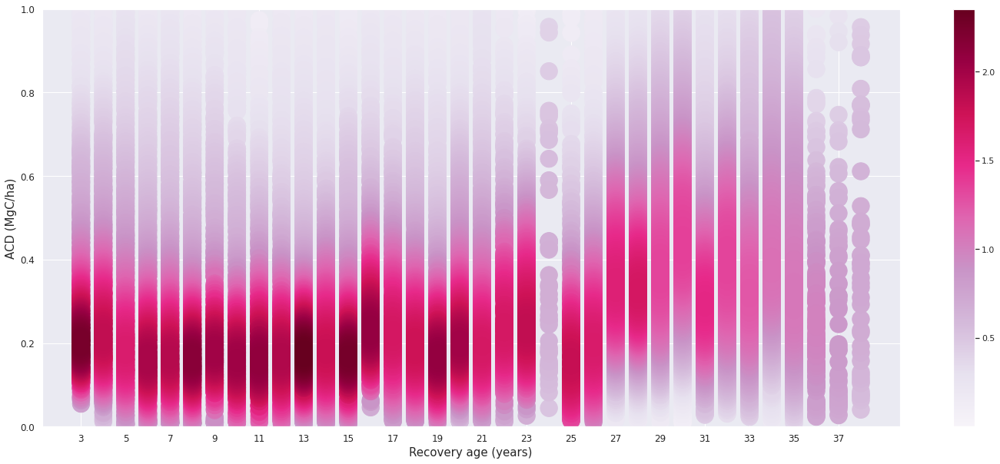

In [74]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 4],
         'time_since_burn',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

60563


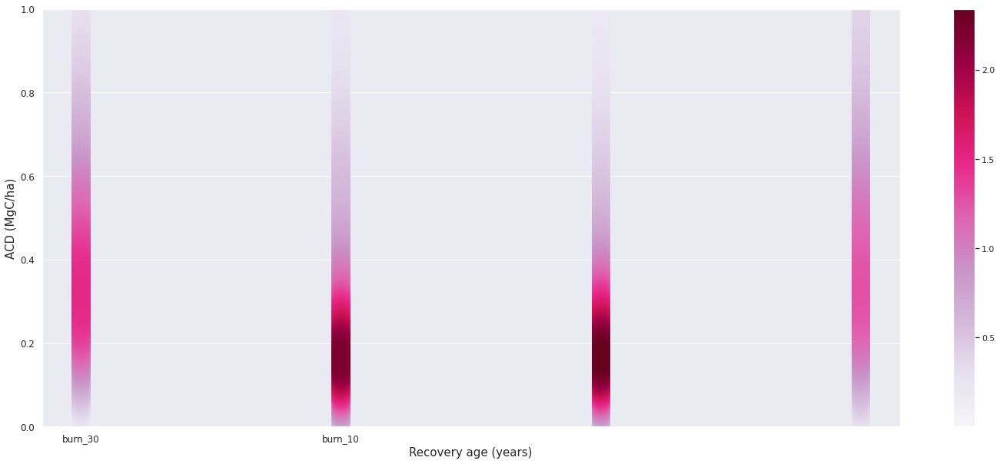

In [68]:
plot_pdf(gedi_burned_trees[gedi_burned_trees.burn_severity_median == 4],
         'time_since_burn_cat',
         'rel_agbd',
         "Recovery age (years)",
         "ACD (MgC/ha)",
         (0, 1))

(0.0, 3.0)

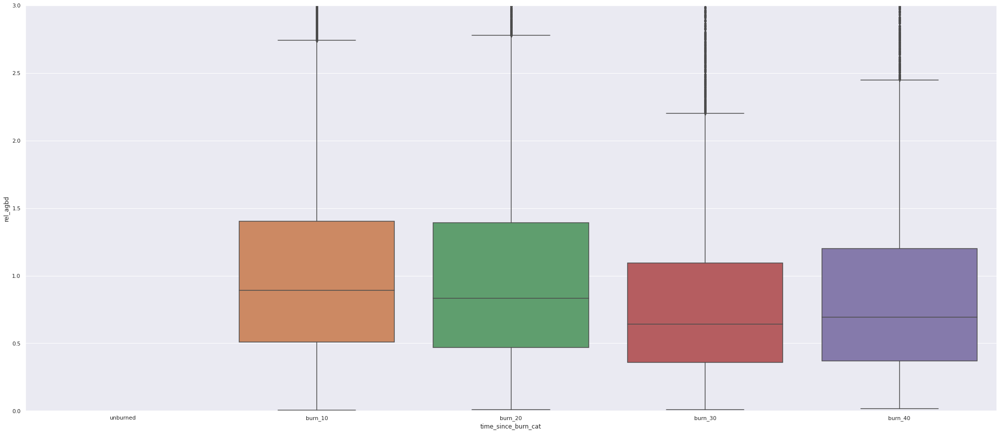

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_burned_trees[gedi_burned_trees.burn_severity_median==2], x='time_since_burn_cat', y="rel_agbd", ax=ax)
ax.set_ylim((0, 3))

(0.0, 2.0)

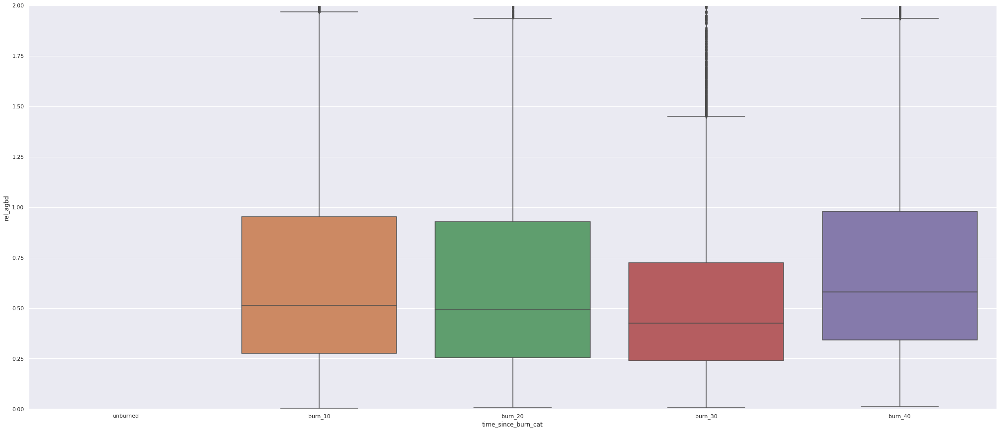

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_burned_trees[gedi_burned_trees.burn_severity_median==3], x='time_since_burn_cat', y="rel_agbd", ax=ax)
ax.set_ylim((0, 2))

(0.0, 2.0)

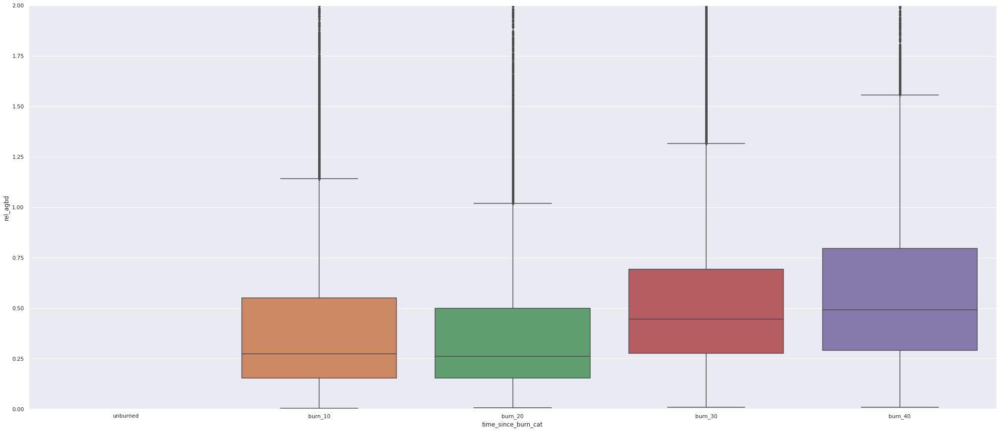

In [80]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_burned_trees[gedi_burned_trees.burn_severity_median==4], x='time_since_burn_cat', y="rel_agbd", ax=ax)
ax.set_ylim((0, 2))

(0.0, 2.0)

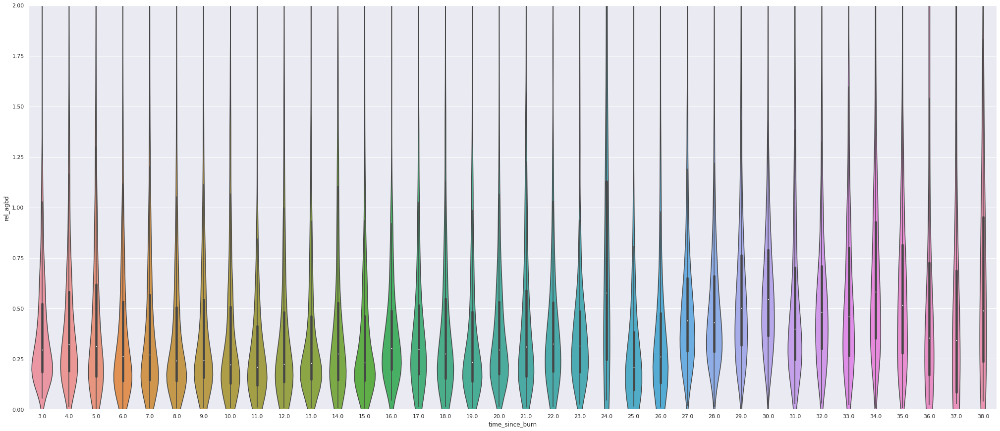

In [83]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.violinplot(gedi_burned_trees[gedi_burned_trees.burn_severity_median==4], x='time_since_burn', y="rel_agbd", ax=ax, showfliers = False)
ax.set_ylim((0, 2))

(0.0, 2.0)

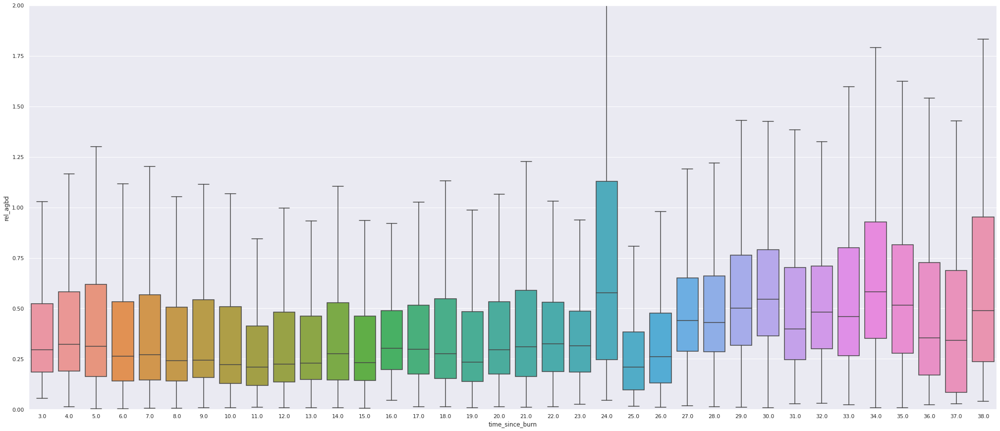

In [84]:
fig, ax = plt.subplots(1, 1, figsize=(35, 15))
sns.boxplot(gedi_burned_trees[gedi_burned_trees.burn_severity_median==4], x='time_since_burn', y="rel_agbd", ax=ax, showfliers = False)
ax.set_ylim((0, 2))

### Visualize nearest neighbor on a map

In [132]:
sierras = gpd.read_file("../../data/shapefiles/sierras_convex_hull.shp")

In [ ]:
nn_indeces, nn_distances, nn_avg_agbd 

In [140]:
nn_indeces[:10].flatten()

array([ 272026, 2105486,  272025, ...,  225591,  216215,  216654])

In [145]:
gedi_unburned_trees.reset_index(drop=True).loc[nn_indeces[0]]

,shot_number,absolute_time,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,l2_quality_flag,l4_quality_flag,...,burn_counts_mean,burn_counts_std,burn_counts_median,land_cover_2x2,land_cover_mean,land_cover_std,land_cover_median,gedi_year,gedi_month,time_since_burn
272026,169791100200077419,2021-12-11 17:35:08.784090+00:00,-121.065098,38.520528,37.052006,10.333430,80.272758,2.985093,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2021,12,-1
2105486,185961100200077165,2022-03-26 00:19:55.183946+00:00,-121.064812,38.520339,34.433990,8.976334,76.388359,2.984105,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2022,3,-1
272025,169791100200077418,2021-12-11 17:35:08.775824+00:00,-121.065606,38.520202,35.918766,9.740457,78.596809,2.984648,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2021,12,-1
272024,169791100200077417,2021-12-11 17:35:08.767558+00:00,-121.066117,38.519876,83.569946,39.109993,144.709381,3.017167,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2021,12,-1
2105485,185961100200077162,2022-03-26 00:19:55.159154+00:00,-121.066341,38.519347,78.734879,12.913584,200.307037,10.294710,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2022,3,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
272000,174560200300287347,2022-01-11 12:14:39.752064+00:00,-121.094374,38.525065,29.999155,-9999.000000,120.148521,11.105733,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2022,1,-1
272064,169790600200452903,2021-12-11 17:35:08.160107+00:00,-121.094223,38.517198,38.202065,10.943408,81.965515,2.985569,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2021,12,-1
2092194,169790500200077624,2021-12-11 17:35:08.279935+00:00,-121.094436,38.524492,67.203918,7.370712,187.161377,11.100927,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2021,12,-1
98,48550800200082735,2019-10-21 14:57:33.444389+00:00,-121.089381,38.491150,78.826050,35.910164,138.398682,3.013059,1,1,...,0.0,0.0,0.0,[1 1 1 1],1.0,0.0,1.0,2019,10,-1


In [152]:
top_10_burned = gedi_burned_trees.head(1)
top_10_unburned_nns = gedi_unburned_trees.reset_index(drop=True).loc[nn_indeces[:1].flatten()]

In [151]:
top_10_burned

,shot_number,absolute_time,lon_lowestmode,lat_lowestmode,agbd,agbd_pi_lower,agbd_pi_upper,agbd_se,l2_quality_flag,l4_quality_flag,...,burn_counts_std,burn_counts_median,land_cover_2x2,land_cover_mean,land_cover_std,land_cover_median,gedi_year,gedi_month,time_since_burn,rel_agbd
30377,141320600300524403,2021-06-11 01:03:13.232091+00:00,-121.065232,38.523326,29.816301,6.703417,69.418312,2.982733,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2021,6,4.0,0.486971
30378,141320600300524405,2021-06-11 01:03:13.248619+00:00,-121.064224,38.522668,28.796034,6.224873,67.855049,2.982503,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2021,6,4.0,0.462693
30379,141320600300524406,2021-06-11 01:03:13.256883+00:00,-121.063721,38.522340,48.694904,16.833782,97.090446,2.990923,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2021,6,4.0,0.781496
30381,141320600300524408,2021-06-11 01:03:13.273411+00:00,-121.062714,38.521683,21.426817,3.090621,56.247093,2.981820,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2021,6,4.0,0.338248
30479,169790800200082537,2021-12-11 17:35:08.887395+00:00,-121.066418,38.526989,16.838388,1.518356,48.646515,2.982546,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2021,12,4.0,0.277308
30503,94310500200077591,2020-08-11 18:10:52.592705+00:00,-121.064539,38.523062,15.311873,1.084821,46.029858,2.983059,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2020,8,3.0,0.245547
30532,48550500200077194,2019-10-21 14:57:33.704756+00:00,-121.064522,38.522867,16.424440,1.395714,47.941940,2.982670,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2019,10,2.0,0.263388
30533,48550500200077195,2019-10-21 14:57:33.713022+00:00,-121.064018,38.523194,51.417576,18.443096,100.935516,2.992563,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2019,10,2.0,0.825363
47711,207320800200083332,2022-08-10 17:42:33.996242+00:00,-120.660378,37.898764,46.550503,15.587555,94.041069,2.989698,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2022,8,18.0,0.437900
47712,207320800200083333,2022-08-10 17:42:34.004508+00:00,-120.659887,37.899093,31.203169,7.368362,71.529083,2.983091,1,1,...,0.0,1.0,[1 1 1 1],1.0,0.0,1.0,2022,8,18.0,0.302731


(38.4, 38.6)

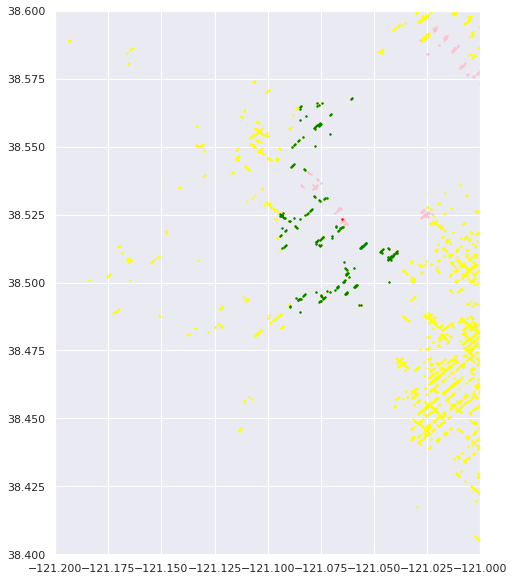

In [160]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
#sierras.boundary.plot(ax=ax)
gedi_burned_trees.plot(ax=ax, markersize=2, color='pink')
gedi_unburned_trees.plot(ax=ax, markersize=2, color='yellow')
top_10_unburned_nns.plot(ax=ax, markersize=2, color='green')
top_10_burned.plot(ax=ax, markersize=2, color='red')
ax.set_xlim((-121.2, -121))
ax.set_ylim((38.4, 38.6))


### Polynomial regression

In [128]:
polynomial_features= PolynomialFeatures(degree=3)

gedi_burn_4 = gedi_burned_trees[gedi_burned_trees.burn_severity_median == 2]
gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2)]
#model = sm.OLS(gedi_burn_4['rel_agbd'], polynomial_features.fit_transform(gedi_burn_4['time_since_burn'])).fit()
#model = sm.OLS(gedi_burn_4['rel_agbd'], sm.add_constant(gedi_burn_4['time_since_burn'])).fit()

#print(model.summary())
#polynomial_features.fit_transform(gedi_burn_4['time_since_burn'])
x = np.reshape(gedi_burn_4['time_since_burn'].to_numpy(), (gedi_burn_4['time_since_burn'].to_numpy().shape[0], 1))
y = np.reshape(gedi_burn_4['rel_agbd'].to_numpy(), (gedi_burn_4['rel_agbd'].to_numpy().shape[0], 1))
xp = polynomial_features.fit_transform(x)

model = sm.OLS(y, xp).fit()
ypred = model.predict(xp)

ypred.shape
_, upper,lower = wls_prediction_std(model)
#print(model.summary())

(0.0, 2.0)

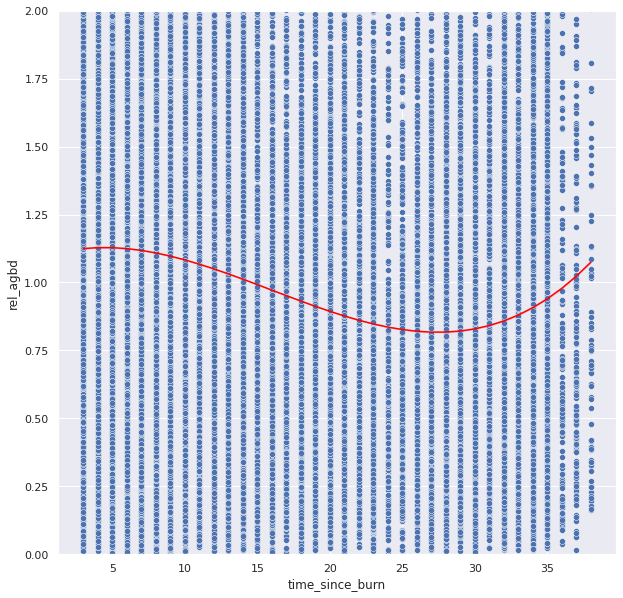

In [129]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sns.scatterplot(gedi_burn_4, x='time_since_burn', y='rel_agbd', ax=ax)
sns.lineplot(x=gedi_burn_4.time_since_burn, y=ypred, color='red', ax=ax)
#sns.lineplot(x=gedi_burn_4.time_since_burn, y=upper, color='green', ax=ax)
#sns.lineplot(x=gedi_burn_4.time_since_burn, y=lower, color='green', ax=ax)
#plt.scatter(x, y)
#plt.pointplot(x, ypred, color='red')
plt.ylim((0, 2))

### Quantile regression

In [94]:
import statsmodels.formula.api as smf

In [121]:
gedi_burn_4 = gedi_burned_trees[gedi_burned_trees.burn_severity_median == 4]
#gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2) & (gedi_burn_4.time_since_burn < 36)]
gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2)]

In [122]:
mod = smf.quantreg("rel_agbd ~ time_since_burn", gedi_burn_4)

In [123]:
quantiles = np.arange(0.05, 0.96, 0.01)
def fit_model(q):
    res = mod.fit(q=q)
    return [
        q, 
        res.params["Intercept"],
        *res.conf_int().loc["Intercept"],
        res.params["time_since_burn"],
        *res.conf_int().loc["time_since_burn"],
        res.prsquared,
    ]


models = [fit_model(x) for x in quantiles]
models = pd.DataFrame(models, columns=["q", "a", "la", "ua", "b", "lb", "ub", "prs"])
print(models)

print(mod.fit(q=0.5).summary())
median = fit_model(0.5)
median = dict(
    q=median[0],
    a=median[1],
    la=median[2],
    ua=median[3],
    b=median[4],
    lb=median[5],
    ub=median[6],
    prs = median[7]
)

bestmod = models[models.prs == models.prs.max()].iloc[0]
print(bestmod)

       q         a        la        ua         b        lb        ub       prs
0   0.05  0.027191  0.023963  0.030418  0.002684  0.002546  0.002822  0.018736
1   0.06  0.033043  0.029948  0.036138  0.002790  0.002658  0.002923  0.020191
2   0.07  0.036040  0.032978  0.039102  0.002980  0.002850  0.003111  0.021194
3   0.08  0.038575  0.035538  0.041611  0.003179  0.003049  0.003308  0.021888
4   0.09  0.040511  0.037492  0.043529  0.003408  0.003280  0.003537  0.022638
..   ...       ...       ...       ...       ...       ...       ...       ...
86  0.91  0.797547  0.771741  0.823352  0.009285  0.008156  0.010414  0.010851
87  0.92  0.844885  0.813295  0.876475  0.009487  0.008105  0.010869  0.010401
88  0.93  0.900542  0.869599  0.931484  0.009825  0.008471  0.011178  0.010308
89  0.94  0.959211  0.922718  0.995703  0.010598  0.009002  0.012194  0.010066
90  0.95  1.050267  1.014340  1.086194  0.010644  0.009073  0.012216  0.010289

[91 rows x 8 columns]
                         Quan

(0.0, 2.0)

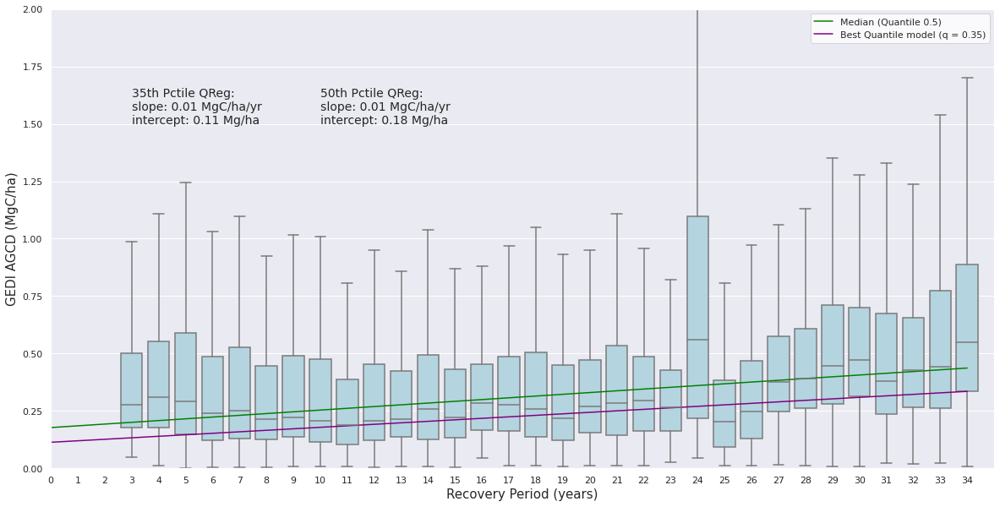

In [124]:
plt.figure(1, (20,10))
ax = sns.boxplot(x="time_since_burn", y="rel_agbd", data=gedi_burn_4, color='lightblue', showfliers=False, order=np.arange(35))
ax.set_ylabel("GEDI AGCD (MgC/ha)", fontsize=15)
ax.set_xlabel("Recovery Period (years)", fontsize=15)
ax.set_xlim([0,35])
xs = np.arange(0, 35)

# cmap = plt.get_cmap('inferno')
get_ys = lambda a, b: a + b * xs
# for i in range(0,models.shape[0], 10):
#     ys = get_ys(models.a[i], models.b[i])
#     ax.plot(xs, ys, linestyle="dotted", color=cmap(i), label='Quantile {0:.2f}'.format(models.q[i]))


med_ys = get_ys(median['a'], median['b'])
ax.plot(xs, med_ys, color='green', label='Median (Quantile 0.5)')

ys_best = get_ys(bestmod['a'], bestmod['b'])
ax.plot(xs, ys_best, color='purple', label='Best Quantile model (q = {0:.2f})'.format(bestmod['q']))

#ax.plot(xs, lin_agcd.intercept + lin_agcd.slope * xs, 'r', label='OLS')
#text_label = (
#    "OLS Regression:\n"
#    "R-value: {0:.2f}\n"
#    "slope: {1:.2f} MgC/ha/yr\n"
#    "intercept: {2:.2f} Mg/ha").format(
#        lin_agcd.rvalue, lin_agcd.slope, lin_agcd.intercept)
#ax.text(x=6, y=205, s=text_label, fontsize=14)

text_label_2 = (
    "50th Pctile QReg:\n"
    "slope: {0:.2f} MgC/ha/yr\n"
    "intercept: {1:.2f} Mg/ha").format(
        median['b'], median['a'])
ax.text(x=10, y=1.5, s=text_label_2, fontsize=14)

text_label_3 = (
    "{0:.0f}th Pctile QReg:\n"
    "slope: {1:.2f} MgC/ha/yr\n"
    "intercept: {2:.2f} Mg/ha").format(
        bestmod['q'] * 100, bestmod['b'], bestmod['a'])
ax.text(x=3, y=1.5, s=text_label_3, fontsize=14)
ax.legend(facecolor='white')
ax.set_ylim([0, 2])

### Linear regression

In [79]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from statsmodels.sandbox.regression.predstd import wls_prediction_std

In [29]:
gedi_burn_4 = gedi_burned_trees[gedi_burned_trees.burn_severity_median == 4]
#gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2) & (gedi_burn_4.time_since_burn < 36)]
gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2)]
model = sm.OLS(gedi_burn_4['rel_agbd'], sm.add_constant(gedi_burn_4['time_since_burn'])).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               rel_agbd   R-squared:                       0.027
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     1653.
Date:                Sun, 14 May 2023   Prob (F-statistic):               0.00
Time:                        11:58:57   Log-Likelihood:                -36887.
No. Observations:               60697   AIC:                         7.378e+04
Df Residuals:                   60695   BIC:                         7.380e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.3134      0.004     

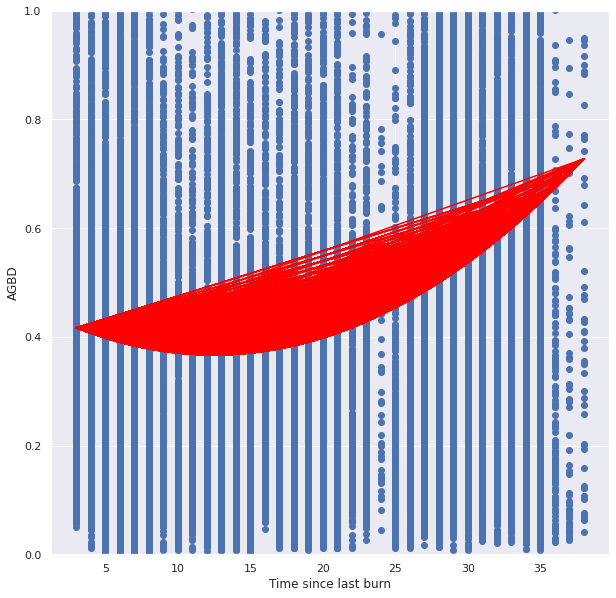

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc = plt.scatter(gedi_burn_4['time_since_burn'], gedi_burn_4['rel_agbd'])#, c = pd.Categorical(master_climate['polygon_id']).codes)
plt.plot(gedi_burn_4['time_since_burn'], model.predict(xp), color='red')
plt.xlabel('Time since last burn')
plt.ylabel('AGBD')
plt.ylim((0, 1))
#categories = [i for i in range(1,9)]
#handles, labels = sc.legend_elements()
#plt.legend(handles, categories, title='Polygon')
plt.show()

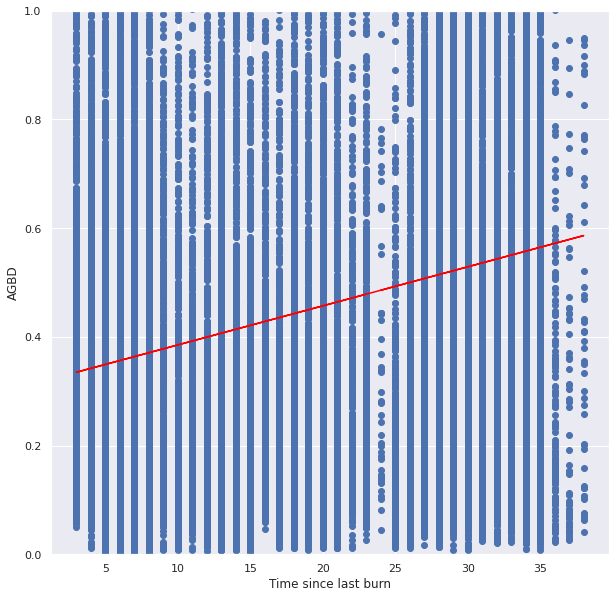

In [33]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc = plt.scatter(gedi_burn_4['time_since_burn'], gedi_burn_4['rel_agbd'])#, c = pd.Categorical(master_climate['polygon_id']).codes)
plt.plot(gedi_burn_4['time_since_burn'], model.predict(), color='red')
plt.xlabel('Time since last burn')
plt.ylabel('AGBD')
plt.ylim((0, 1))
#categories = [i for i in range(1,9)]
#handles, labels = sc.legend_elements()
#plt.legend(handles, categories, title='Polygon')
plt.show()

In [34]:
gedi_burn_4 = gedi_burned_trees[gedi_burned_trees.burn_severity_median == 3]
#gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2) & (gedi_burn_4.time_since_burn < 36)]
gedi_burn_4 = gedi_burn_4[(gedi_burn_4.time_since_burn > 2)]
model = sm.OLS(gedi_burn_4['rel_agbd'], sm.add_constant(gedi_burn_4['time_since_burn'])).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               rel_agbd   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     81.35
Date:                Sun, 14 May 2023   Prob (F-statistic):           1.97e-19
Time:                        12:00:46   Log-Likelihood:                -38593.
No. Observations:               38254   AIC:                         7.719e+04
Df Residuals:                   38252   BIC:                         7.721e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               0.7095      0.007    1

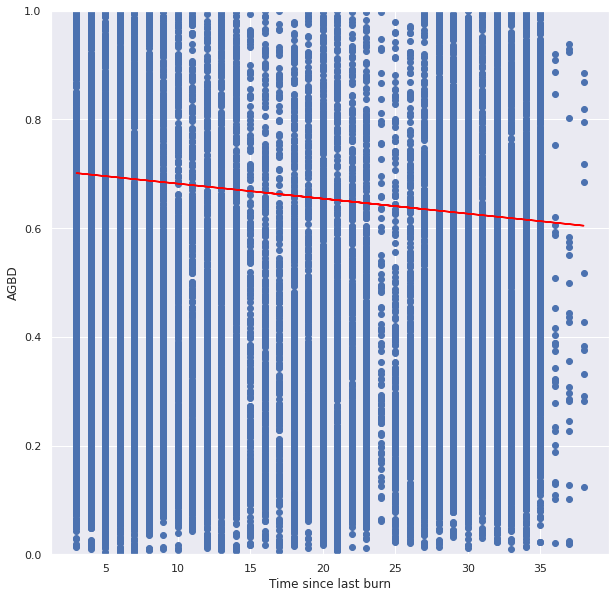

In [35]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
sc = plt.scatter(gedi_burn_4['time_since_burn'], gedi_burn_4['rel_agbd'])#, c = pd.Categorical(master_climate['polygon_id']).codes)
plt.plot(gedi_burn_4['time_since_burn'], model.predict(), color='red')
plt.xlabel('Time since last burn')
plt.ylabel('AGBD')
plt.ylim((0, 1))
#categories = [i for i in range(1,9)]
#handles, labels = sc.legend_elements()
#plt.legend(handles, categories, title='Polygon')
plt.show()

### Plot the data geographically

In [31]:
sierras = gpd.read_file("../../data/shapefiles/sierras_convex_hull.shp")

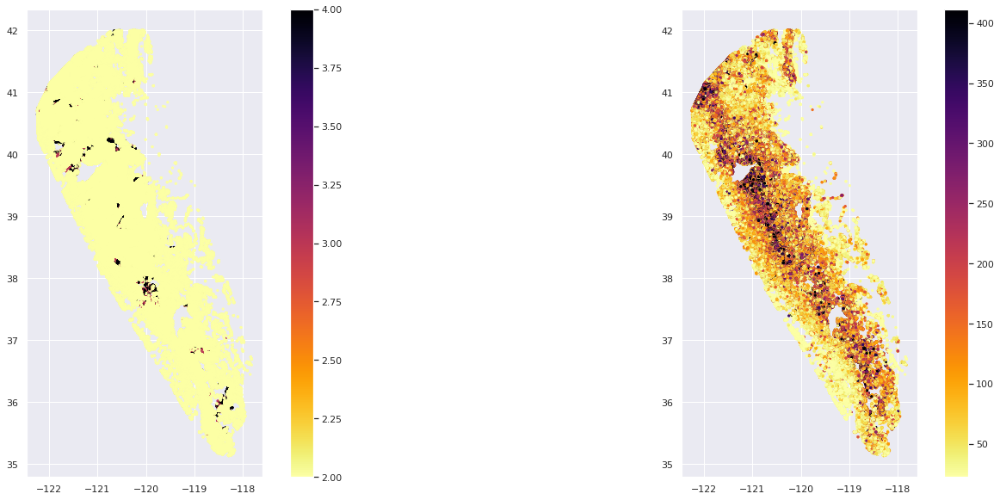

In [32]:
fig, ax = plt.subplots(1, 2, figsize=(25,10))
geo_plot(gedi_trees, ax[0], 'burn_severity_median', vmin=2, vmax=4)
geo_plot(gedi_trees, ax[1], 'agbd')

<AxesSubplot: >

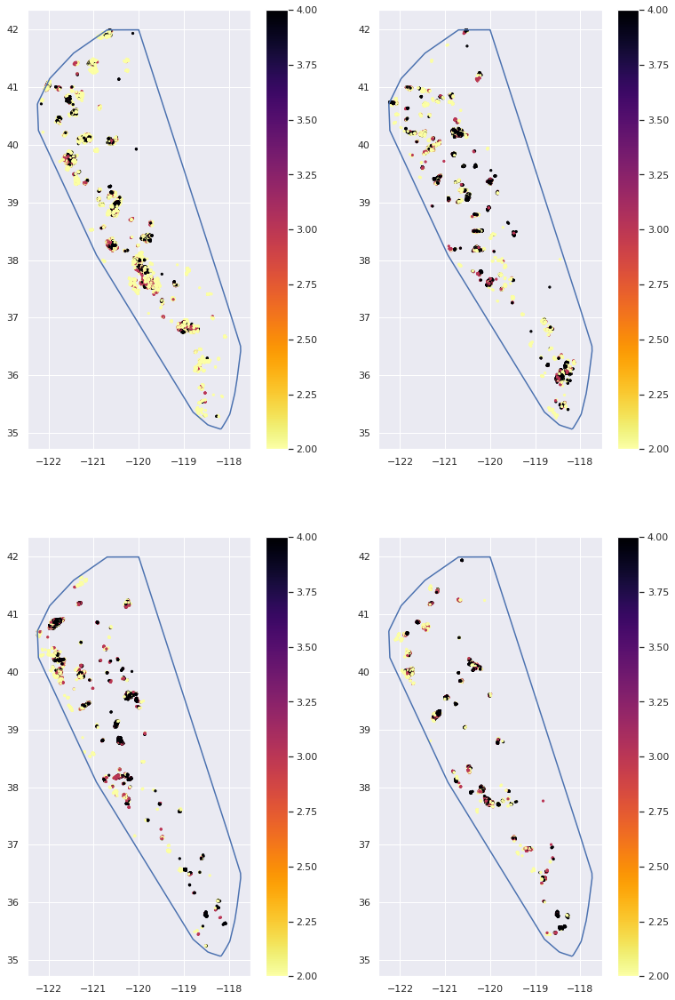

In [204]:
fig, ax = plt.subplots(2, 2, figsize=(13, 20))
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10'], ax[0][0], 'burn_severity_median', vmin=2, vmax=4)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_20'], ax[0][1], 'burn_severity_median', vmin=2, vmax=4)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_30'], ax[1][0], 'burn_severity_median', vmin=2, vmax=4)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_40'], ax[1][1], 'burn_severity_median', vmin=2, vmax=4)
sierras.boundary.plot(ax=ax[0][0])
sierras.boundary.plot(ax=ax[0][1])
sierras.boundary.plot(ax=ax[1][0])
sierras.boundary.plot(ax=ax[1][1])

<AxesSubplot: >

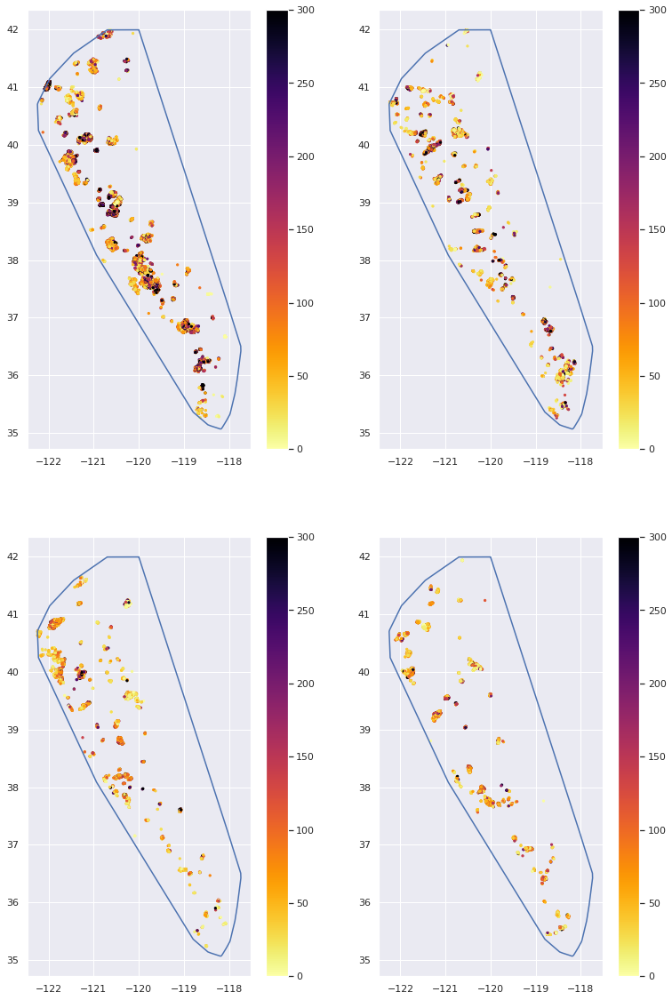

In [222]:
fig, ax = plt.subplots(2, 2, figsize=(13, 20))
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10'], ax[0][0], 'agbd', vmin=0, vmax=300)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_20'], ax[0][1], 'agbd', vmin=0, vmax=300)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_30'], ax[1][0], 'agbd', vmin=0, vmax=300)
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'burn_40'], ax[1][1], 'agbd', vmin=0, vmax=300)
sierras.boundary.plot(ax=ax[0][0])
sierras.boundary.plot(ax=ax[0][1])
sierras.boundary.plot(ax=ax[1][0])
sierras.boundary.plot(ax=ax[1][1])

<AxesSubplot: >

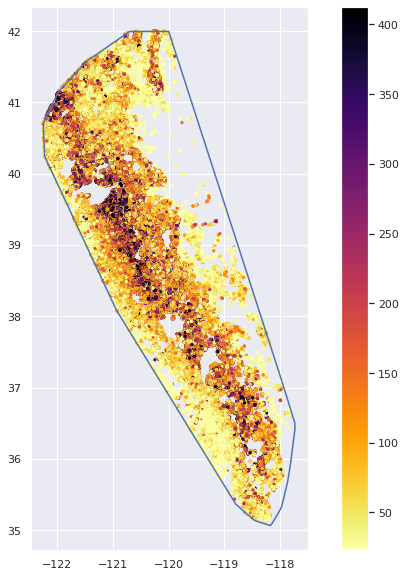

In [225]:
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
geo_plot(gedi_trees[gedi_trees.time_since_burn_cat == 'unburned'], ax, 'agbd')
sierras.boundary.plot(ax=ax)

/home/jk871/drought-with-gedi/drought/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


<AxesSubplot: >

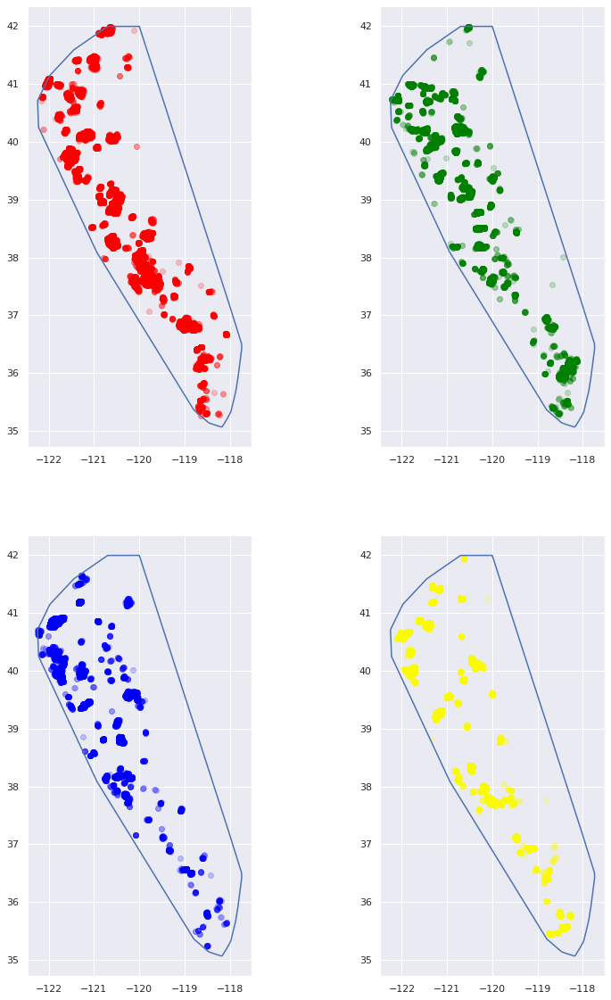

In [210]:
fig, ax = plt.subplots(2, 2, figsize=(13, 20))
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10'].plot(column='agbd', ax=ax[0][0], legend=True, color='red', alpha=0.2)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_20'].plot(column='agbd', ax=ax[0][1], legend=True, color='green', alpha=0.2)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_30'].plot(column='agbd', ax=ax[1][0], legend=True, color='blue', alpha=0.2)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_40'].plot(column='agbd', ax=ax[1][1], legend=True, color='yellow', alpha=0.2)
sierras.boundary.plot(ax=ax[0][0])
sierras.boundary.plot(ax=ax[0][1])
sierras.boundary.plot(ax=ax[1][0])
sierras.boundary.plot(ax=ax[1][1])

/home/jk871/drought-with-gedi/drought/lib/python3.10/site-packages/geopandas/plotting.py:656: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  warnings.warn(


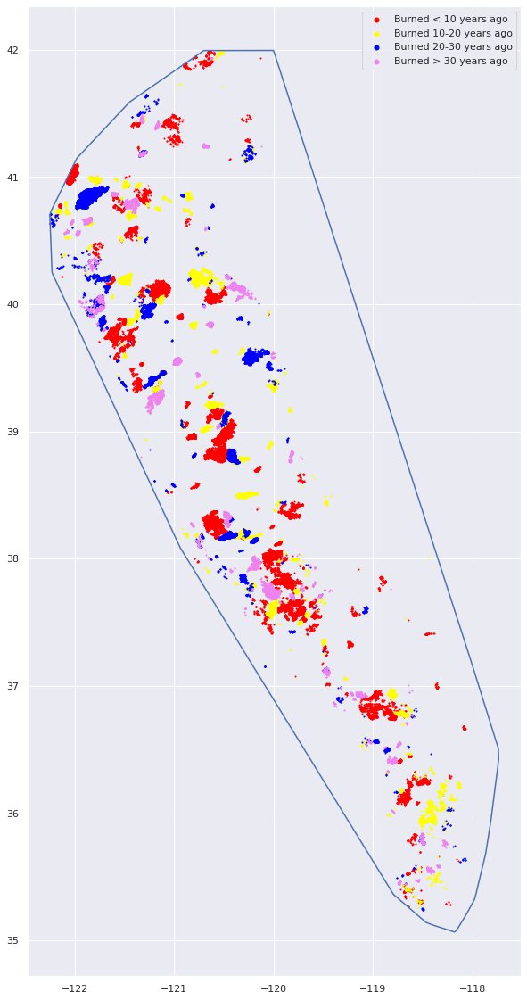

In [219]:
fig, ax = plt.subplots(1,1, figsize=(13, 20))
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_10'].plot(column='agbd', ax=ax, legend=True, color='red', markersize=1)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_20'].plot(column='agbd', ax=ax, legend=True, color='yellow', markersize=1)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_30'].plot(column='agbd', ax=ax, legend=True, color='blue', markersize=1)
gedi_trees[gedi_trees.time_since_burn_cat == 'burn_40'].plot(column='agbd', ax=ax, legend=True, color='violet', markersize=1)

sierras.boundary.plot(ax=ax)
plt.legend(['Burned < 10 years ago', 'Burned 10-20 years ago', 'Burned 20-30 years ago', 'Burned > 30 years ago'], markerscale = 5)


In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(35, 10))
sns.pointplot(gedi_burned_trees[gedi_burned_trees.burn_severity_sample == 2], x='time_since_burn', y='agbd')
sns.pointplot(gedi_burn_imperfect_match[gedi_burn_imperfect_match.burn_severity_sample == 1], x='time_since_burn', y='agbd', color='red')

### Look at unburned region

In [73]:
print(f'GEDI unburned shots: {gedi_unburned.shape[0]}')
print(f'GEDI unburned tree shots: {gedi_unburned_trees.shape[0]}')

GEDI unburned shots: 7829875


In [78]:
print('AGBD stats for unburned')
print(gedi_unburned_trees.agbd.describe())

print('AGBD stats for burned')
print(gedi_burned_trees.agbd.describe())

AGBD stats for unburned
count    2.856458e+06
mean     1.531952e+02
std      1.317868e+02
min      4.797173e-01
25%      5.792078e+01
50%      1.157059e+02
75%      2.078579e+02
max      4.822505e+03
Name: agbd, dtype: float64
AGBD stats for burned
count    126224.000000
mean        110.389136
std         122.778903
min           0.834731
25%          32.127316
50%          69.451138
75%         136.369278
max        2114.207764
Name: agbd, dtype: float64


In [79]:
print('AGBD stats for burned, severity == 2')
print(gedi_burned_trees[gedi_burned_trees.burn_severity_median==2].agbd.describe())

print('AGBD stats for burned, severity == 3')
print(gedi_burned_trees[gedi_burned_trees.burn_severity_median==3].agbd.describe())

print('AGBD stats for burned, severity == 4')
print(gedi_burned_trees[gedi_burned_trees.burn_severity_median==4].agbd.describe())

AGBD stats for burned, severity == 2
count    44429.000000
mean       185.359152
std        159.512139
min          0.870713
25%         66.874855
50%        140.779327
75%        256.842957
max       1914.888306
Name: agbd, dtype: float64
AGBD stats for burned, severity == 3
count    17193.000000
mean        87.445992
std         93.397168
min          1.009095
25%         30.505957
50%         58.366970
75%        110.912811
max       2086.356445
Name: agbd, dtype: float64
AGBD stats for burned, severity == 4
count    64602.000000
mean        64.935723
std         59.686386
min          0.834731
25%         24.993123
50%         48.109180
75%         87.826307
max       2114.207764
Name: agbd, dtype: float64


(0.0, 1500.0)

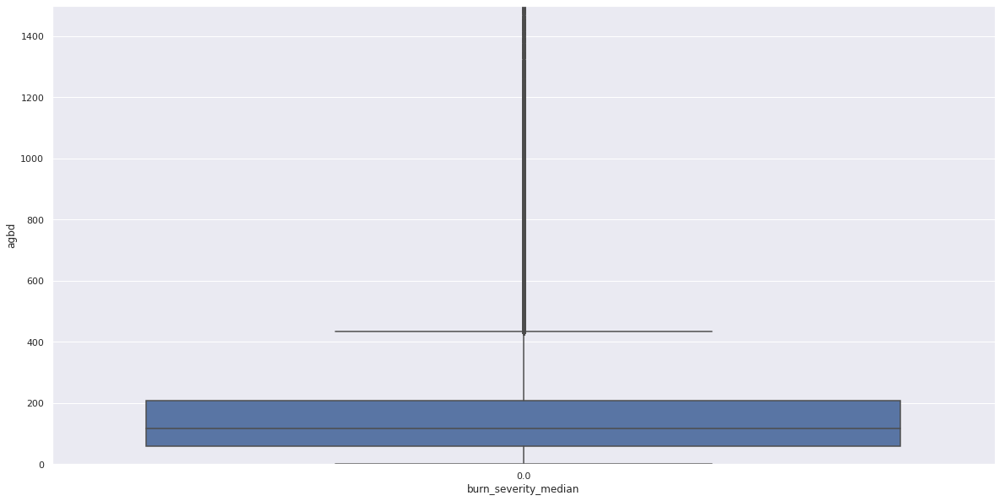

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
sns.boxplot(gedi_unburned_trees, x='burn_severity_median', y='agbd')
ax.set_ylim((0, 1500))